# Groupal analysis notebook for Double T-maze task

### Trial condition

- Allostatic_agent_data0 : 0.0008, 0.0004, 0.0003, 0.0002, 0.01

- Allostatic_agent_data1 : 0.001, 0.0005, 0.0004, 0.0003, 0.01

- Allostatic_agent_data2 : 0.001, 0.0005, 0.0004, 0.0003, 0.01 - Security x10
- Allostatic_agent_data3 : 0.005, 0.0005, 0.0004, 0.0003, 0.01 - Security x10 - Time=2000
- Allostatic_agent_data4 : 0.005.0005, 0.0004, 0.0003, 0.01 - Time=2000
- Allostatic_agent_data5 : 0.005, 0.0005, 0.0004, 0.0003, 0.01 - Security x2 - Time=2000

IMPORTANT: In these datasets and in Control_agent_data, the security internal state needs to be corrected to dV - security. A cell is dedicated to this matter.

## Import libraries

In [1]:
from scipy.stats import pearsonr, linregress
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import statistics
import csv
import os

## Import data

In [2]:
allostatic_folder_path = '../data/Allostatic_agent_data4/'
control_folder_path = '../data/Control_agent_data4/'

In [3]:
allostatic_csv_files = [f for f in os.listdir(allostatic_folder_path) if os.path.isfile(os.path.join(allostatic_folder_path, f))]
print("CSV files in the allostatic directory:", allostatic_csv_files)
allostatic_n_experiments = len(allostatic_csv_files)
print("Total allostatic experiments =", allostatic_n_experiments)
print()
control_csv_files = [f for f in os.listdir(control_folder_path) if os.path.isfile(os.path.join(control_folder_path, f))]
print("CSV files in the control directory:", control_csv_files)
control_n_experiments = len(control_csv_files)
print("Total control experiments =", control_n_experiments)

CSV files in the allostatic directory: ['7.csv', '10.csv', '20.csv', '12.csv', '17.csv', '1.csv', '3.csv', '16.csv', '11.csv', '14.csv', '6.csv', '2.csv', '19.csv', '18.csv', '13.csv', '5.csv', '4.csv', '9.csv', '15.csv', '8.csv']
Total allostatic experiments = 20

CSV files in the control directory: ['7.csv', '10.csv', '20.csv', '12.csv', '17.csv', '1.csv', '3.csv', '16.csv', '11.csv', '14.csv', '6.csv', '2.csv', '19.csv', '18.csv', '13.csv', '5.csv', '4.csv', '9.csv', '15.csv', '8.csv']
Total control experiments = 20


In [4]:
allostatic_csv_order = []
for i in range(allostatic_n_experiments):
    allostatic_csv_order.append(int(allostatic_csv_files[i][:-4]))

control_csv_order = []
for i in range(control_n_experiments):
    control_csv_order.append(int(control_csv_files[i][:-4]))

allostatic_sorted_pairs = sorted(zip(allostatic_csv_order, allostatic_csv_files))
control_sorted_pairs = sorted(zip(control_csv_order, control_csv_files))
allostatic_sorted_list1, allostatic_sorted_csv_files = zip(*allostatic_sorted_pairs)
control_sorted_list1, control_sorted_csv_files = zip(*control_sorted_pairs)

In [5]:
allostatic_data = []
for i in range(allostatic_n_experiments):
    allostatic_csv_filename = allostatic_folder_path + allostatic_sorted_csv_files[i]
    allostatic_data.append(pd.read_csv(allostatic_csv_filename))

control_data = []
for i in range(control_n_experiments):
    control_csv_filename = control_folder_path + control_sorted_csv_files[i]
    control_data.append(pd.read_csv(control_csv_filename))

In [6]:
for i in range(allostatic_n_experiments):
    allostatic_data[i]['Row_index'] = allostatic_data[i].index
print('Number of columns in allostatic agent= ' + str(allostatic_data[0].shape[1]))
print('Number of rows in allostatic agent= ' + str(allostatic_data[0].shape[0]))
allostatic_data[0]

Number of columns in allostatic agent= 17
Number of rows in allostatic agent= 16170


,Trial_number,Trial_time,Gradient_T,X,Y,Z,IS_temperature,IS_hydration,IS_energy,IS_security,IS_mating,Att_temperature,Att_hydration,Att_energy,Att_security,Att_mating,Row_index
0,0,0.03200,0.95701,0.00000,-0.00749,269.99958,0.8995,0.8995,0.1996,1.00000,0.8997,0.01744,0.23899,0.09735,0.00325,0.11671,0
1,0,0.28800,0.95701,0.00000,-0.00690,269.99958,0.8990,0.8990,0.1992,1.00000,0.8994,-0.00000,0.35247,0.09962,-0.00000,0.13163,1
2,0,0.41600,0.95701,0.00000,-0.00671,269.99958,0.8985,0.8985,0.1988,1.00000,0.8991,0.23244,0.34583,-0.00000,0.08057,0.27405,2
3,0,0.54400,0.95701,-0.00008,-0.00203,270.54093,0.8980,0.8980,0.1984,1.00000,0.8988,0.34904,0.15185,0.00144,0.17909,0.23281,3
4,0,0.64000,0.95701,-0.00005,0.00937,271.29376,0.8975,0.8975,0.1980,1.00000,0.8985,0.11424,0.03910,-0.00000,0.10516,0.24037,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16165,0,1999.45605,0.93054,-0.76243,1.17023,1.53152,1.0000,0.3340,0.9972,0.19210,0.4309,0.06853,0.41756,0.04698,0.13392,0.08205,16165
16166,0,1999.55200,0.93808,-0.75275,1.17001,1.69138,1.0000,0.3335,0.9968,0.19210,0.4306,0.05875,0.43800,0.02268,0.10193,0.06519,16166
16167,0,1999.68005,0.93808,-0.73984,1.16967,1.89080,1.0000,0.3330,0.9964,0.21282,0.4303,0.10955,0.40816,0.01983,0.11187,0.02284,16167
16168,0,1999.83997,0.93808,-0.72371,1.16918,2.08663,1.0000,0.3325,0.9960,0.21282,0.4300,0.07751,0.43733,-0.00000,0.09848,-0.00000,16168


In [7]:
for i in range(control_n_experiments):
    control_data[i]['Row_index'] = control_data[i].index
print('Number of columns in control agent= ' + str(control_data[0].shape[1]))
print('Number of rows in control agent= ' + str(control_data[0].shape[0]))
control_data[0]

Number of columns in control agent= 17
Number of rows in control agent= 16092


,Trial_number,Trial_time,Gradient_T,X,Y,Z,IS_temperature,IS_hydration,IS_energy,IS_security,IS_mating,Att_temperature,Att_hydration,Att_energy,Att_security,Att_mating,Row_index
0,0,0.03200,0.95701,-0.01485,-0.00208,342.37838,0.8995,0.8995,0.1996,1.00000,0.8997,-0.00000,-0.00000,0.09961,0.20970,-0.00000,0
1,0,0.22400,0.95701,-0.01580,-0.00014,356.21487,0.8990,0.8990,0.1992,1.00000,0.8994,-0.00000,-0.00000,0.10233,0.17013,-0.00000,1
2,0,0.35200,0.95701,-0.01155,0.00159,6.91466,0.8985,0.8985,0.1988,1.00000,0.8991,-0.00000,-0.00000,0.23999,0.47476,0.02368,2
3,0,0.48000,0.95701,-0.00627,0.00192,14.46127,0.8980,0.8980,0.1984,1.00000,0.8988,-0.00000,-0.00000,0.40664,0.15311,-0.00000,3
4,0,0.67200,0.95701,0.00141,0.00018,18.43962,0.8975,0.8975,0.1980,1.00000,0.8985,-0.00000,0.00988,0.25116,0.24400,-0.00000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16087,0,1999.42395,0.93054,-0.35206,0.14567,106.86911,1.0000,0.0000,0.0000,0.91771,0.8041,0.09367,0.11534,0.47466,0.07903,0.03195,16087
16088,0,1999.55200,0.93054,-0.35552,0.13499,101.96374,1.0000,0.0000,0.0000,0.91771,0.8038,0.10167,0.16172,0.50246,0.06899,-0.00000,16088
16089,0,1999.68005,0.93054,-0.35769,0.12285,105.43896,1.0000,0.0000,0.0000,0.91771,0.8035,0.13857,0.11661,0.48230,0.05388,-0.00000,16089
16090,0,1999.77600,0.93054,-0.35944,0.11402,111.62258,1.0000,0.0000,0.0000,0.91771,0.8032,0.09150,0.11398,0.53967,0.00899,0.03533,16090


## Variable formatting

In [8]:
allostatic_Xpose = []
allostatic_Ypose = []
allostatic_meanXpose = []
allostatic_meanYpose = []
allostatic_IS_temperature = []
allostatic_IS_hydration = []
allostatic_IS_energy = []
allostatic_IS_security = []
allostatic_IS_mating = []
allostatic_gradient_temp = []
allostatic_trial_time = []


for i in range(allostatic_n_experiments):
    allostatic_Xpose.append(allostatic_data[i]['X'].to_list())
    allostatic_Ypose.append(allostatic_data[i]['Y'].to_list())
    allostatic_meanXpose.append(np.mean(allostatic_Xpose[i]))
    allostatic_meanYpose.append(np.mean(allostatic_Ypose[i]))
    allostatic_IS_temperature.append(allostatic_data[i]['IS_temperature'].to_list())
    allostatic_IS_hydration.append(allostatic_data[i]['IS_hydration'].to_list())
    allostatic_IS_energy.append(allostatic_data[i]['IS_energy'].to_list())
    allostatic_IS_security.append(allostatic_data[i]['IS_security'].to_list())
    allostatic_IS_mating.append(allostatic_data[i]['IS_mating'].to_list())
    allostatic_gradient_temp.append(allostatic_data[i]['Gradient_T'].to_list())
    allostatic_trial_time.append(allostatic_data[i]['Trial_time'].to_list())

In [9]:
# CORRECTING SECURITY VALUES
#allostatic_IS_security = [[1 - element for element in sublist] for sublist in allostatic_IS_security]

In [10]:
control_Xpose = []
control_Ypose = []
control_meanXpose = []
control_meanYpose = []
control_IS_temperature = []
control_IS_hydration = []
control_IS_energy = []
control_IS_security = []
control_IS_mating = []
control_gradient_temp = []
control_trial_time = []


for i in range(control_n_experiments):
    control_Xpose.append(control_data[i]['X'].to_list())
    control_Ypose.append(control_data[i]['Y'].to_list())
    control_meanXpose.append(np.mean(control_Xpose[i]))
    control_meanYpose.append(np.mean(control_Ypose[i]))
    control_IS_temperature.append(control_data[i]['IS_temperature'].to_list())
    control_IS_hydration.append(control_data[i]['IS_hydration'].to_list())
    control_IS_energy.append(control_data[i]['IS_energy'].to_list())
    control_IS_security.append(control_data[i]['IS_security'].to_list())
    control_IS_mating.append(control_data[i]['IS_mating'].to_list())
    control_gradient_temp.append(control_data[i]['Gradient_T'].to_list())
    control_trial_time.append(control_data[i]['Trial_time'].to_list())

### Allostatic agent trajectory

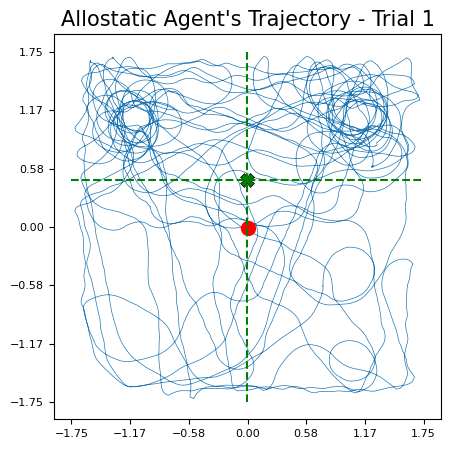

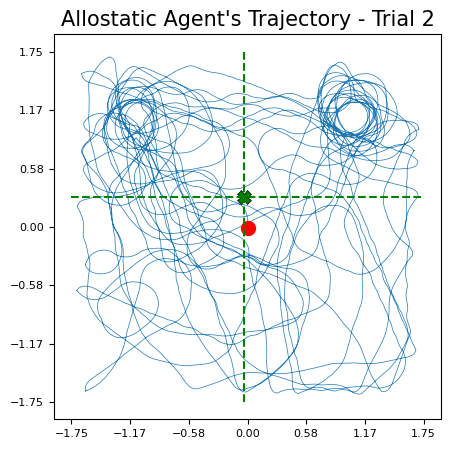

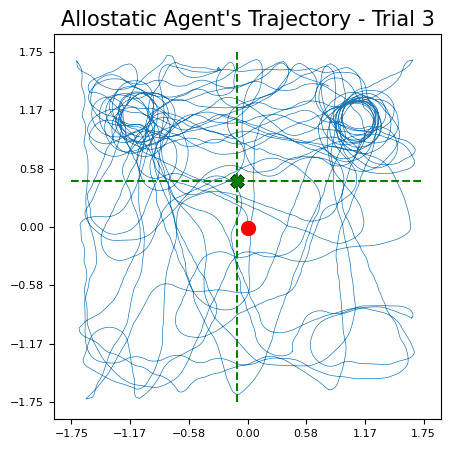

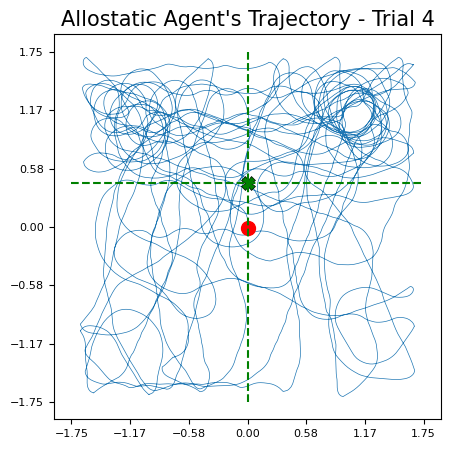

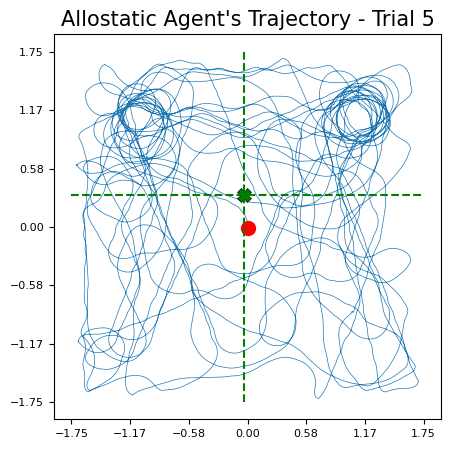

...

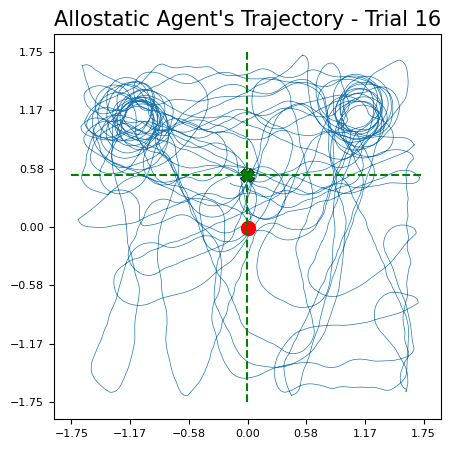

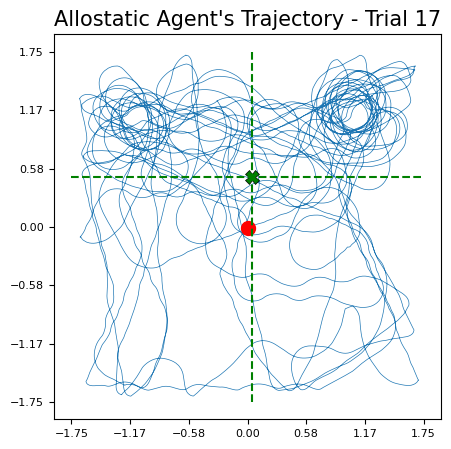

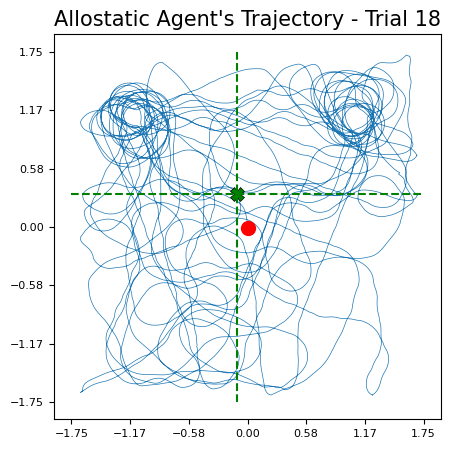

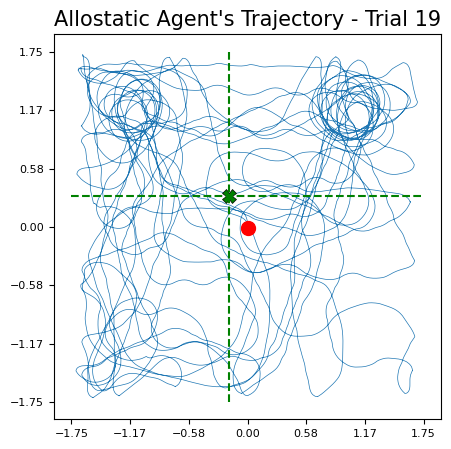

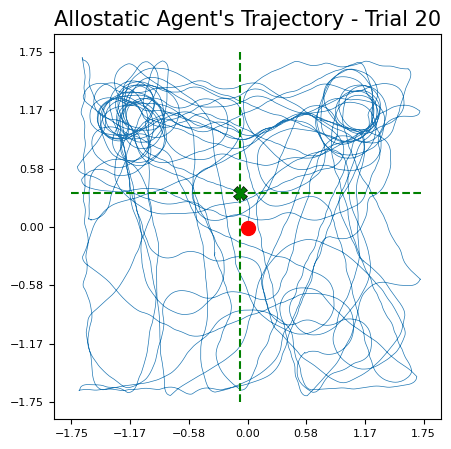

In [11]:
ticks = np.arange(-1.75, 1.8, step=0.5833)
ticks = [round(elem, 2) for elem in ticks]

for i in range(allostatic_n_experiments):
    fig = plt.figure(figsize=(5, 5))
    plt.plot(allostatic_Xpose[i], allostatic_Ypose[i], linewidth=0.5)
    
    plt.yticks(ticks, fontsize=8)
    plt.xticks(ticks, fontsize=8)
    
    plt.title("Allostatic Agent's Trajectory - Trial " + allostatic_sorted_csv_files[i][:-4], fontsize=15)
    plt.plot(allostatic_Xpose[i][0],allostatic_Ypose[i][0],'ro', markersize=10)
    plt.plot(allostatic_meanXpose[i],allostatic_meanYpose[i],'Xg', markersize=10, markeredgecolor='black', markeredgewidth=0.5)
    plt.plot([allostatic_meanXpose[i], allostatic_meanXpose[i]], [-1.75, 1.75], color='green', linestyle='dashed', linewidth=1.5)
    plt.plot([-1.75, 1.75], [allostatic_meanYpose[i], allostatic_meanYpose[i]], color='green', linestyle='dashed', linewidth=1.5)
    plt.show()

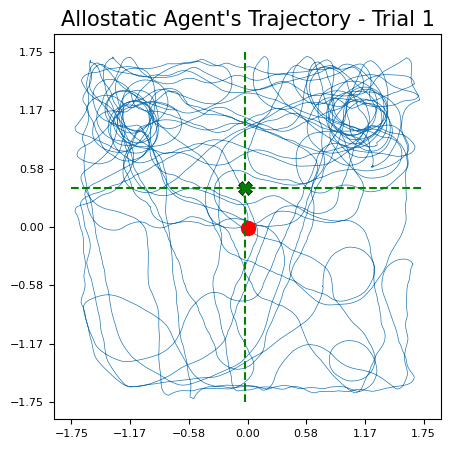

In [12]:
trial = 0
fig = plt.figure(figsize=(5, 5))
plt.plot(allostatic_Xpose[trial], allostatic_Ypose[trial], linewidth=0.5)

plt.yticks(ticks, fontsize=8)
plt.xticks(ticks, fontsize=8)

plt.title("Allostatic Agent's Trajectory - Trial " + allostatic_sorted_csv_files[trial][:-4], fontsize=15)
plt.plot(allostatic_Xpose[trial][0],allostatic_Ypose[trial][0],'ro', markersize=10)
plt.plot(np.mean(allostatic_meanXpose), np.mean(allostatic_meanYpose) ,'Xg', markersize=10, markeredgecolor='black', markeredgewidth=0.5)
plt.plot([np.mean(allostatic_meanXpose), np.mean(allostatic_meanXpose)], [-1.75, 1.75], color='green', linestyle='dashed', linewidth=1.5)
plt.plot([-1.75, 1.75], [np.mean(allostatic_meanYpose), np.mean(allostatic_meanYpose)], color='green', linestyle='dashed', linewidth=1.5)
plt.show()

### Control agent trajectory

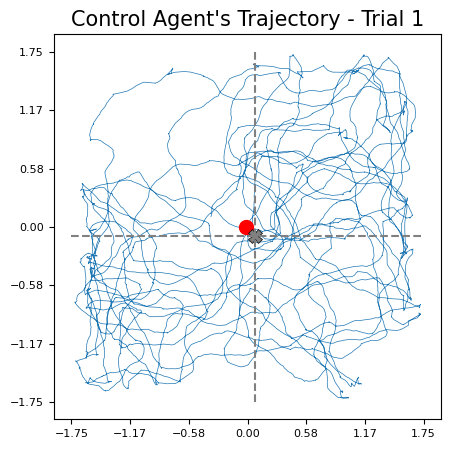

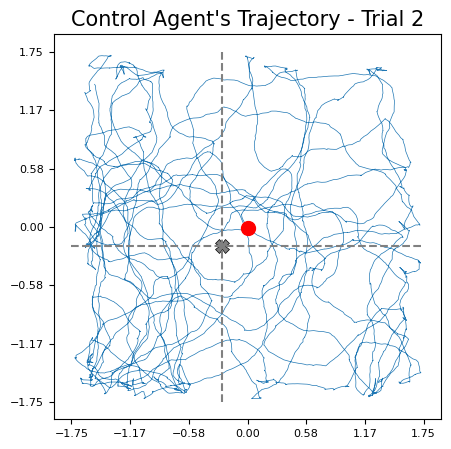

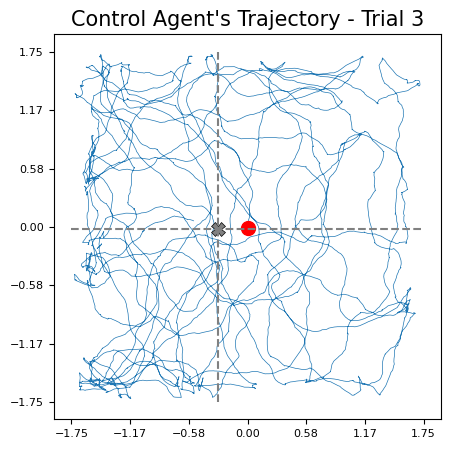

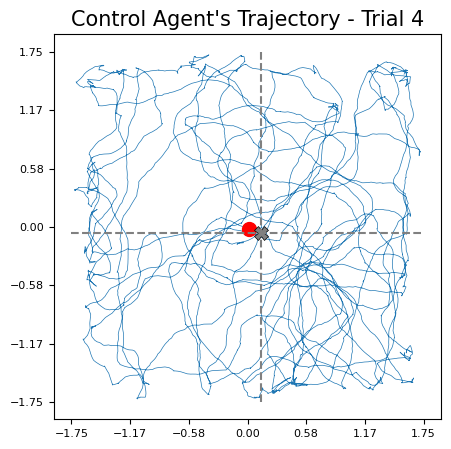

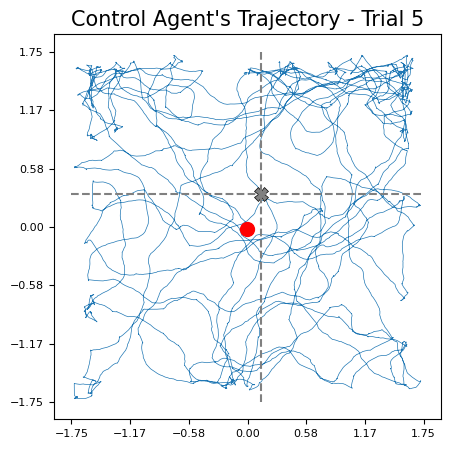

...

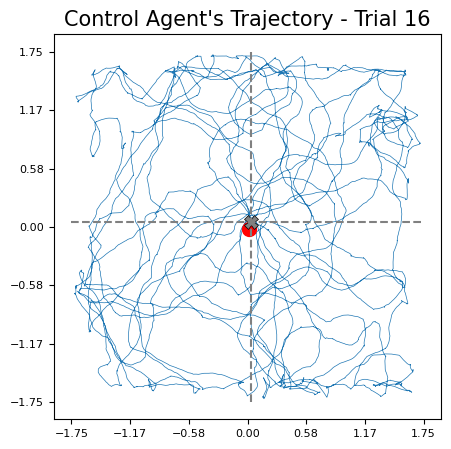

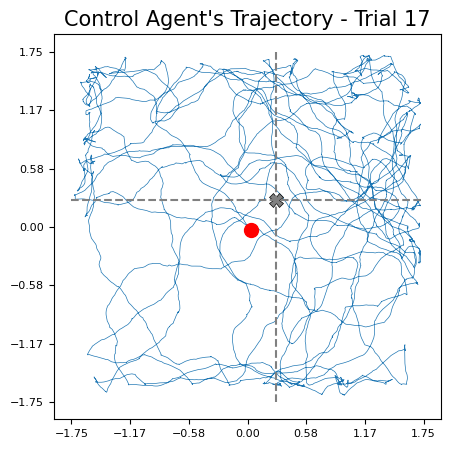

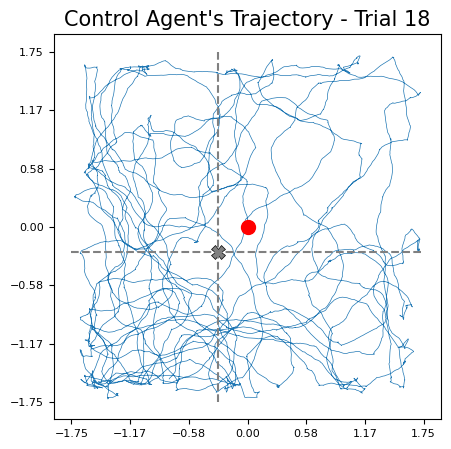

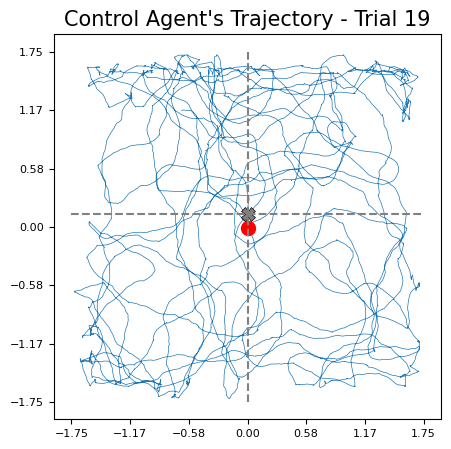

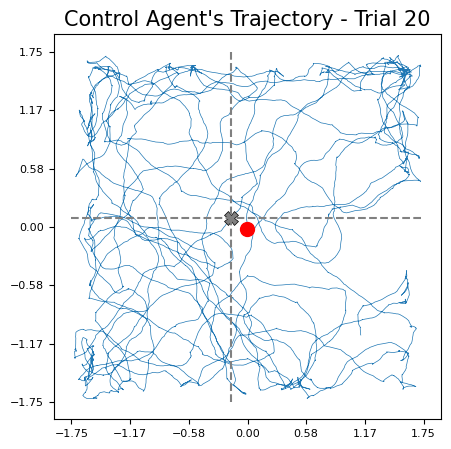

In [13]:
for i in range(control_n_experiments):
    fig = plt.figure(figsize=(5, 5))
    plt.plot(control_Xpose[i], control_Ypose[i], linewidth=0.5)
    
    plt.yticks(ticks, fontsize=8)
    plt.xticks(ticks, fontsize=8)
    
    plt.title("Control Agent's Trajectory - Trial " + control_sorted_csv_files[i][:-4], fontsize=15)
    plt.plot(control_Xpose[i][0],control_Ypose[i][0],'ro', markersize=10)
    plt.plot(control_meanXpose[i],control_meanYpose[i],'X', color='gray', markersize=10, markeredgecolor='black', markeredgewidth=0.5)
    plt.plot([control_meanXpose[i], control_meanXpose[i]], [-1.75, 1.75], color='gray', linestyle='dashed', linewidth=1.5)
    plt.plot([-1.75, 1.75], [control_meanYpose[i], control_meanYpose[i]], color='gray', linestyle='dashed', linewidth=1.5)
    plt.show()

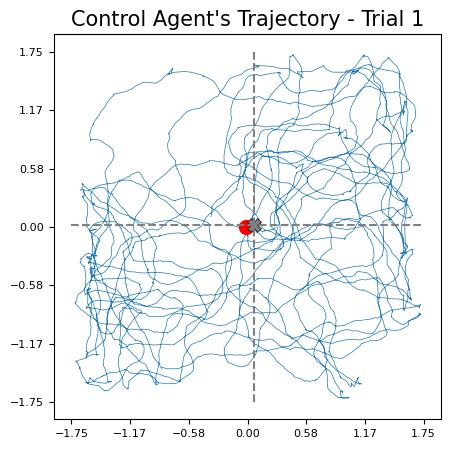

In [14]:
trial = 0
fig = plt.figure(figsize=(5, 5))
plt.plot(control_Xpose[trial], control_Ypose[trial], linewidth=0.5)

plt.yticks(ticks, fontsize=8)
plt.xticks(ticks, fontsize=8)

plt.title("Control Agent's Trajectory - Trial " + control_sorted_csv_files[trial][:-4], fontsize=15)
plt.plot(control_Xpose[trial][0],control_Ypose[trial][0],'ro', markersize=10)
plt.plot(np.mean(control_meanXpose), np.mean(control_meanYpose),'X', color='gray', markersize=10, markeredgecolor='black', markeredgewidth=0.5)
plt.plot([np.mean(control_meanXpose), np.mean(control_meanXpose)], [-1.75, 1.75], color='gray', linestyle='dashed', linewidth=1.5)
plt.plot([-1.75, 1.75], [np.mean(control_meanYpose), np.mean(control_meanYpose)], color='gray', linestyle='dashed', linewidth=1.5)
plt.show()

### Allostatic agent occupancy map

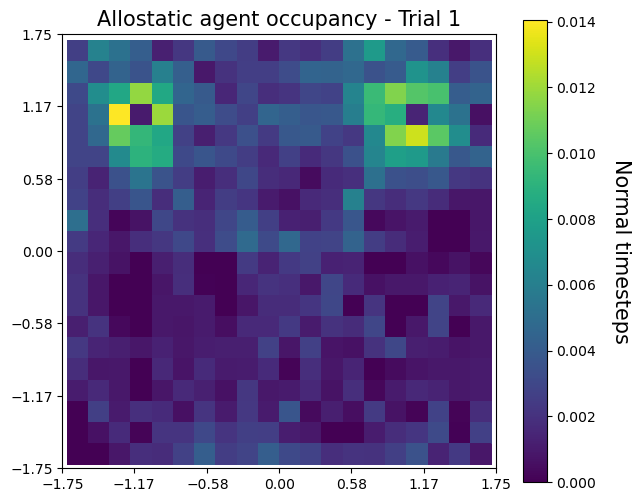

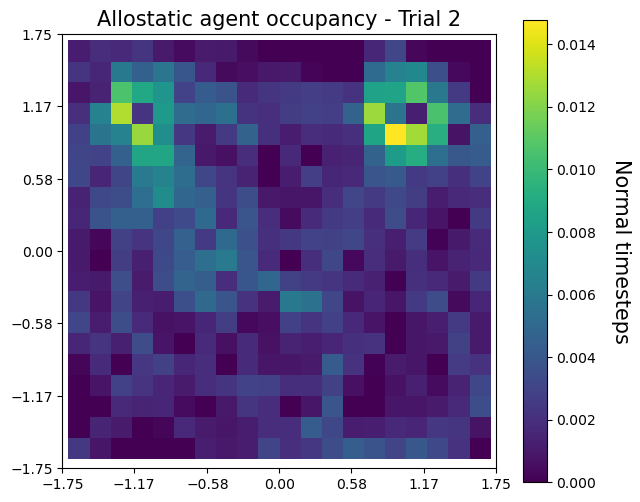

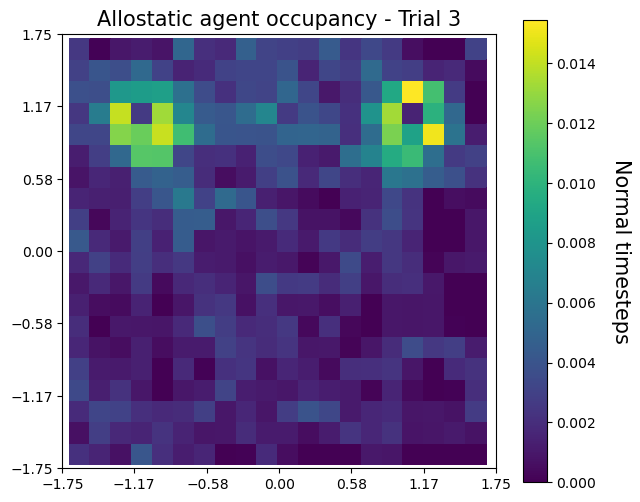

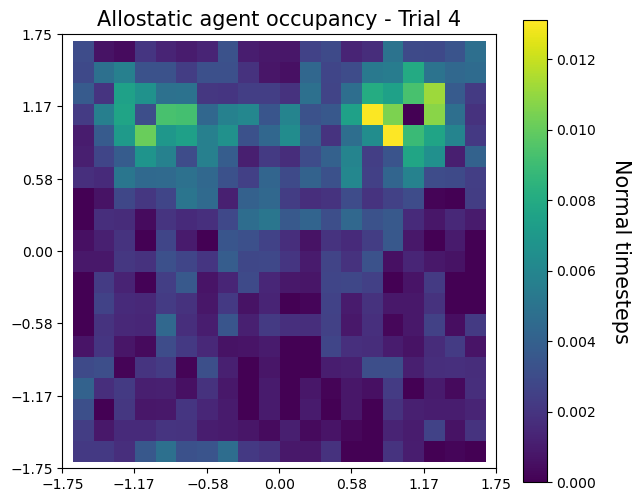

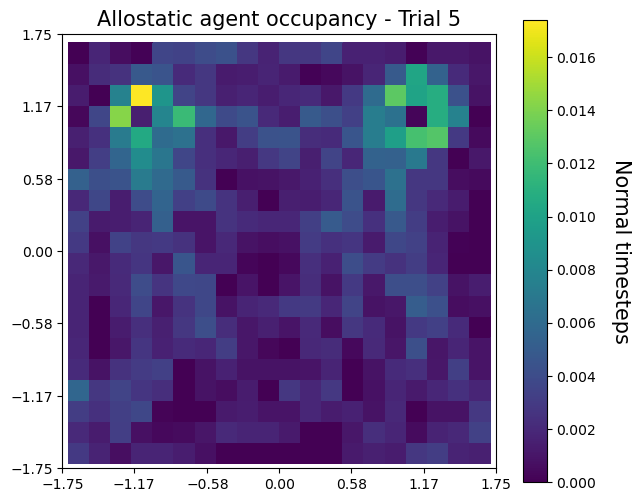

...

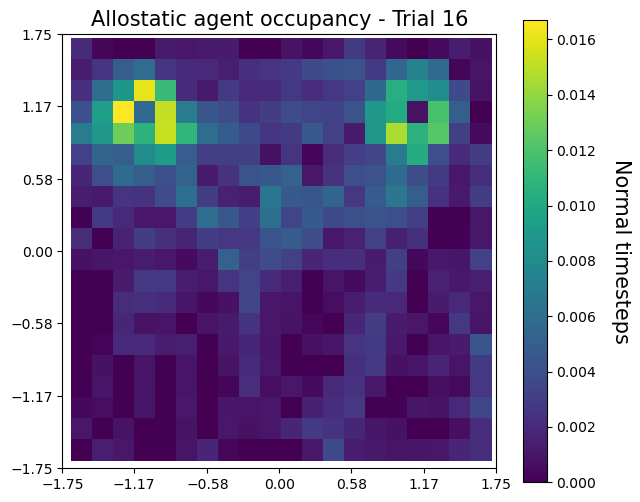

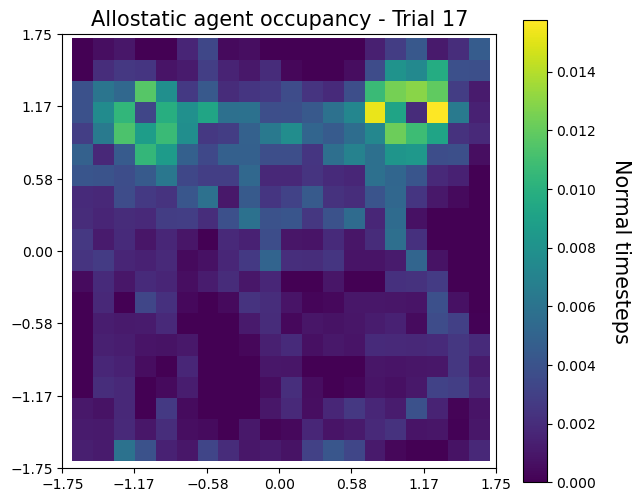

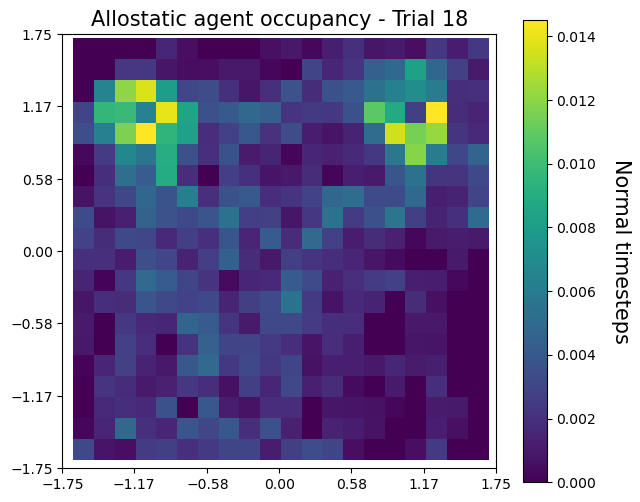

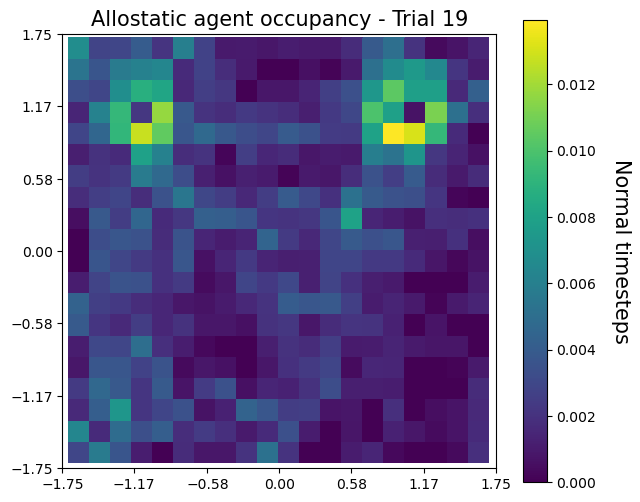

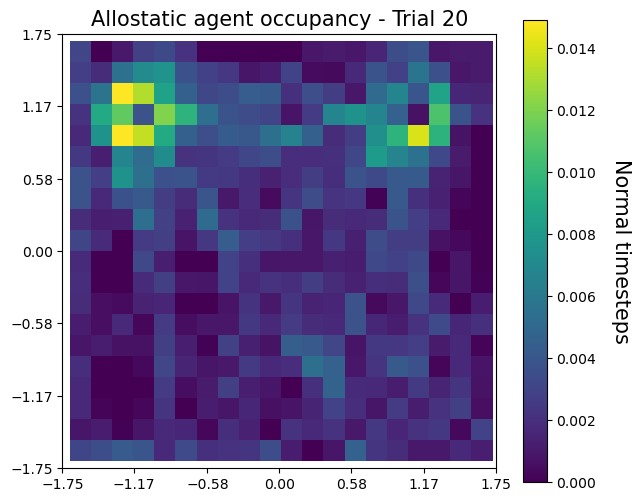

In [15]:
for a in range(allostatic_n_experiments):
    Xpose = allostatic_Xpose[a]
    Ypose = allostatic_Ypose[a]


    xy_array = np.column_stack((Xpose, Ypose))
    x_array = xy_array[:,0]
    y_array = xy_array[:,1]
    
    bins = 20
    xedges= []
    yedges= []
    
    xedges = np.linspace(min(Xpose), max(Xpose), bins + 1)
    yedges = np.linspace(min(Ypose), max(Ypose), bins + 1)
    
    
    fig, ax = plt.subplots(figsize=(7, 6))
    ax.set_aspect("equal")
    hist, xbins, ybins, im = ax.hist2d(x_array, y_array, bins=(xedges, yedges))
    H = hist.T
    H_normalized = H/float(xy_array.shape[0])      
            
    ax.set_title("Allostatic agent occupancy - Trial " + allostatic_sorted_csv_files[a][:-4], fontsize=15)
    ax.set_yticks(ticks)
    ax.set_xticks(ticks)
    hist = ax.imshow(H_normalized, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    cbar = fig.colorbar(hist)
    cbar.set_label('Normal timesteps', rotation=270, fontsize=15, labelpad=+25)
    
    plt.show()

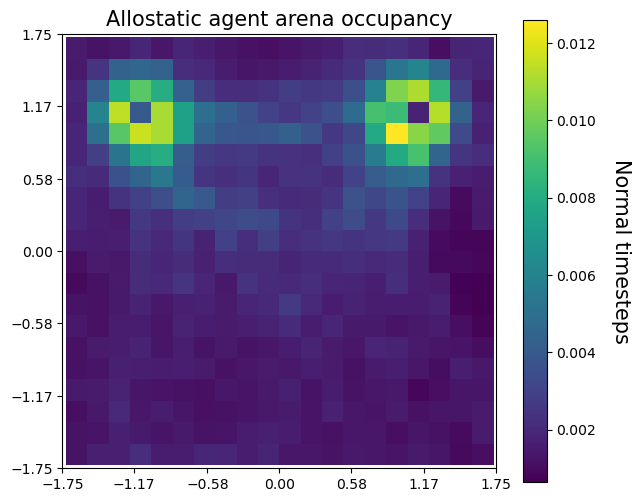

In [16]:
exp_Xpose = np.concatenate(allostatic_Xpose)
exp_Ypose = np.concatenate(allostatic_Ypose)

xy_array = np.column_stack((exp_Xpose, exp_Ypose))
x_array = xy_array[:,0]
y_array = xy_array[:,1]

bins = 20
xedges = np.linspace(min(exp_Xpose), max(exp_Xpose), bins + 1)
yedges = np.linspace(min(exp_Ypose), max(exp_Ypose), bins + 1)


fig, ax = plt.subplots(figsize=(7, 6))
ax.set_aspect("equal")
hist, xbins, ybins, im = ax.hist2d(x_array, y_array, bins=(xedges, yedges))
H = hist.T
H_normalized = H/float(xy_array.shape[0])


'''for i in range(len(ybins)-1):
    for j in range(len(xbins)-1):
        ax.text(xbins[j]+xedges[1]/2, ybins[i]+yedges[1]/2, round(H_normalized[i,j],5), fontsize=5, ha="center", va="center", color="w")'''
        
        
ax.set_title("Allostatic agent arena occupancy", fontsize=15)
ax.set_yticks(ticks)
ax.set_xticks(ticks)
hist = ax.imshow(H_normalized, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
cbar = fig.colorbar(hist)
cbar.set_label('Normal timesteps', rotation=270, fontsize=15, labelpad=+25)

plt.show()

### Control agent occupancy map

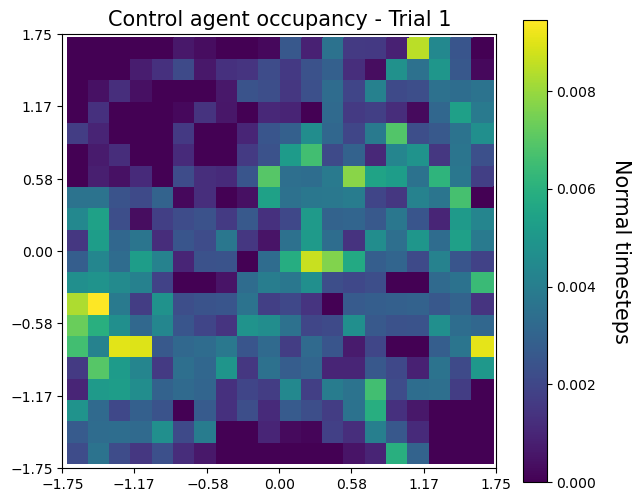

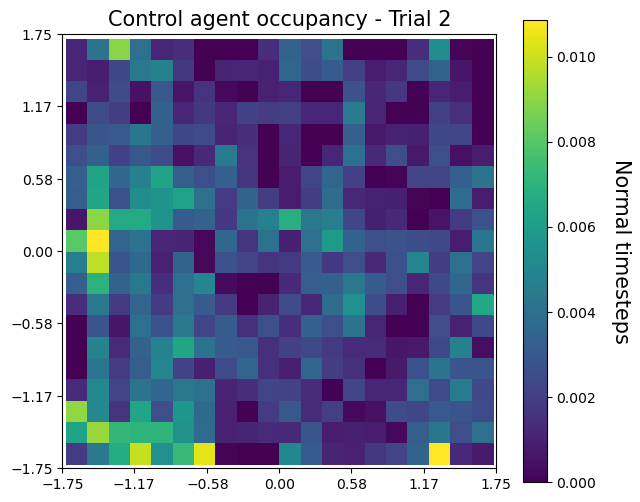

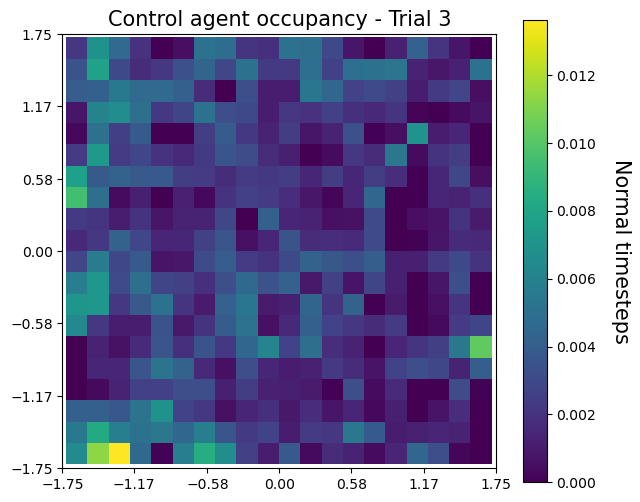

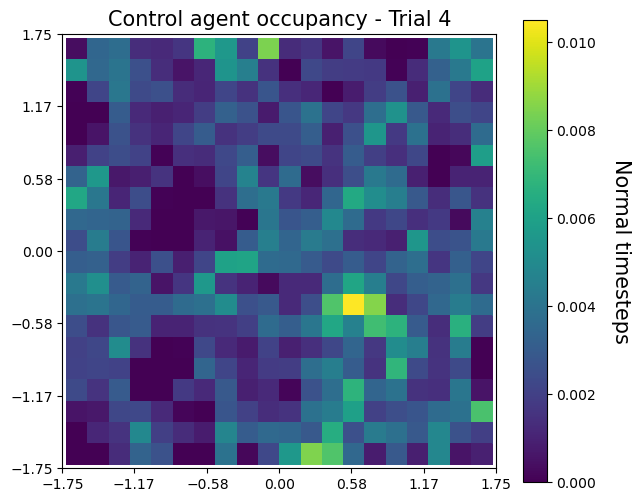

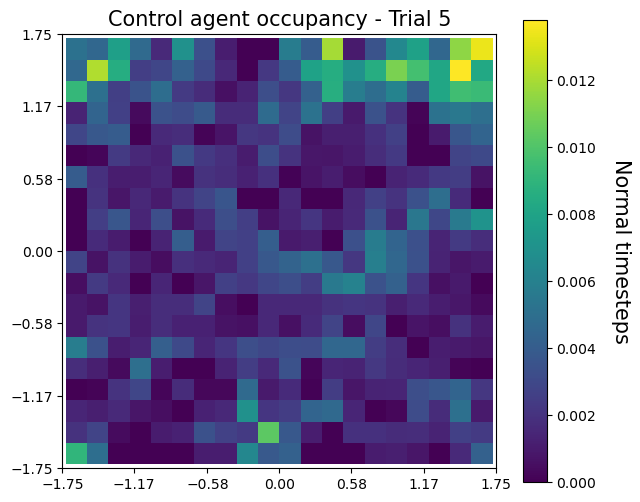

...

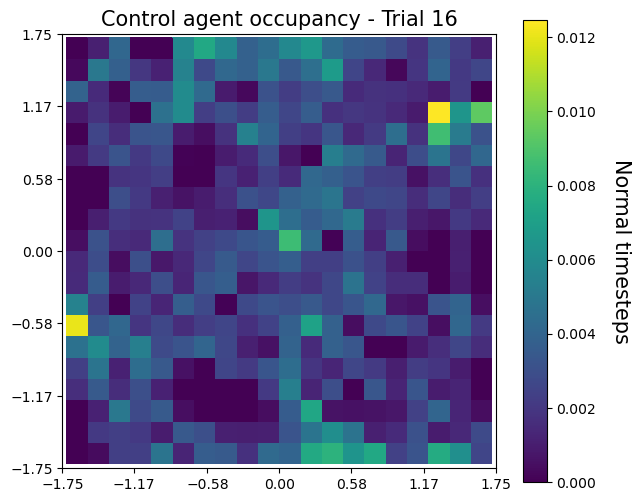

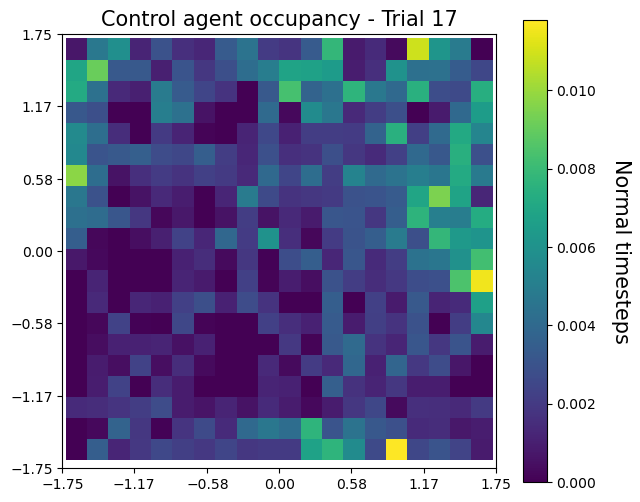

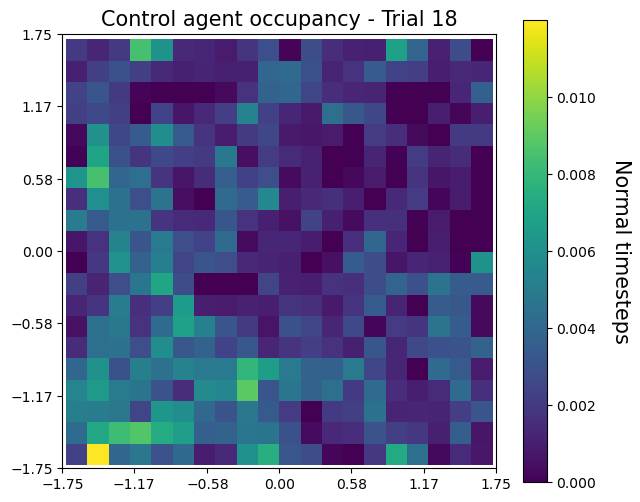

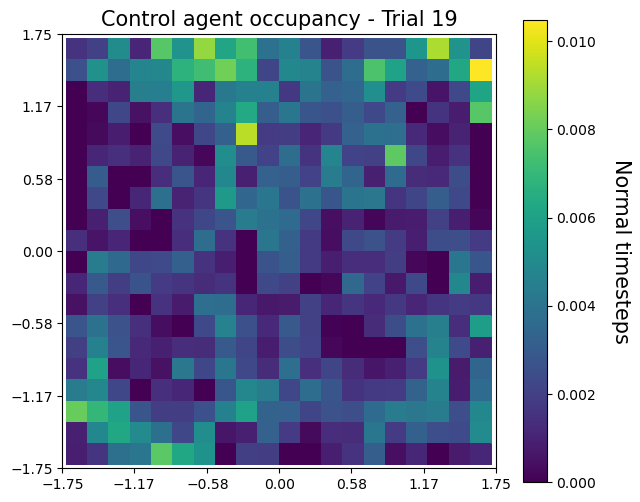

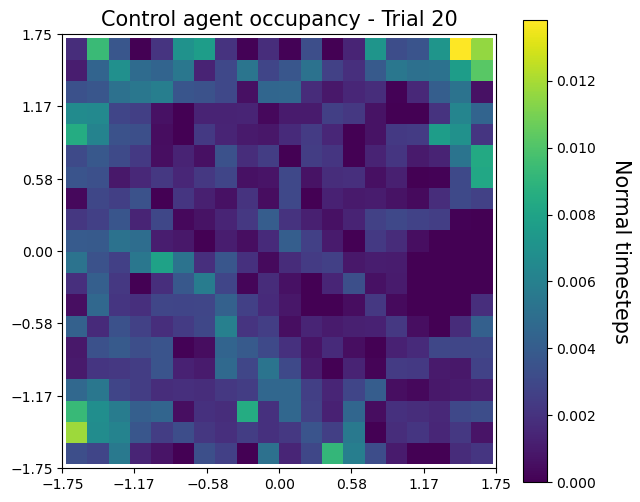

In [17]:
for a in range(control_n_experiments):
    Xpose = control_Xpose[a]
    Ypose = control_Ypose[a]


    xy_array = np.column_stack((Xpose, Ypose))
    x_array = xy_array[:,0]
    y_array = xy_array[:,1]
    
    bins = 20
    xedges= []
    yedges= []
    
    xedges = np.linspace(min(Xpose), max(Xpose), bins + 1)
    yedges = np.linspace(min(Ypose), max(Ypose), bins + 1)
    
    
    fig, ax = plt.subplots(figsize=(7, 6))
    ax.set_aspect("equal")
    hist, xbins, ybins, im = ax.hist2d(x_array, y_array, bins=(xedges, yedges))
    H = hist.T
    H_normalized = H/float(xy_array.shape[0])      
            
    ax.set_title("Control agent occupancy - Trial " + control_sorted_csv_files[a][:-4], fontsize=15)
    ax.set_yticks(ticks)
    ax.set_xticks(ticks)
    hist = ax.imshow(H_normalized, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    cbar = fig.colorbar(hist)
    cbar.set_label('Normal timesteps', rotation=270, fontsize=15, labelpad=+25)
    
    plt.show()

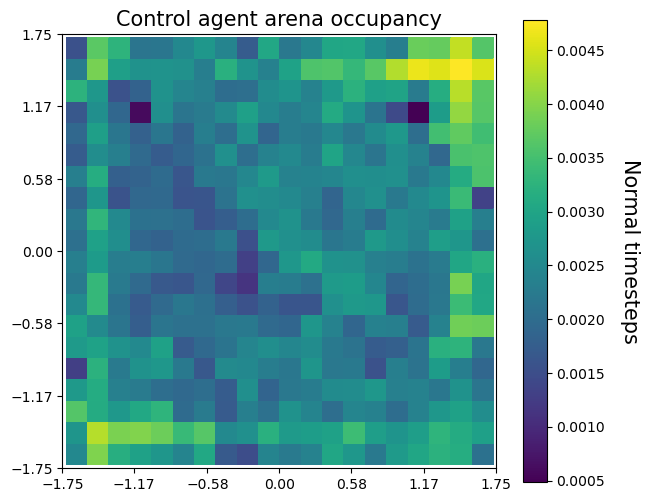

In [18]:
exp_Xpose = np.concatenate(control_Xpose)
exp_Ypose = np.concatenate(control_Ypose)

xy_array = np.column_stack((exp_Xpose, exp_Ypose))
x_array = xy_array[:,0]
y_array = xy_array[:,1]

bins = 20
xedges = np.linspace(min(exp_Xpose), max(exp_Xpose), bins + 1)
yedges = np.linspace(min(exp_Ypose), max(exp_Ypose), bins + 1)


fig, ax = plt.subplots(figsize=(7, 6))
ax.set_aspect("equal")
hist, xbins, ybins, im = ax.hist2d(x_array, y_array, bins=(xedges, yedges))
H = hist.T
H_normalized = H/float(xy_array.shape[0])


'''for i in range(len(ybins)-1):
    for j in range(len(xbins)-1):
        ax.text(xbins[j]+xedges[1]/2, ybins[i]+yedges[1]/2, round(H_normalized[i,j],5), fontsize=5, ha="center", va="center", color="w")'''
        
        
ax.set_title("Control agent arena occupancy", fontsize=15)
ax.set_yticks(ticks)
ax.set_xticks(ticks)
hist = ax.imshow(H_normalized, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
cbar = fig.colorbar(hist)
cbar.set_label('Normal timesteps', rotation=270, fontsize=15, labelpad=+25)

plt.show()

### Internal state analysis

In this analysis we take the mean internal state for each need and each session.

In [19]:
allostatic_means_IS_temperature = []
allostatic_means_IS_hydration = []
allostatic_means_IS_energy = []
allostatic_means_IS_security = []
allostatic_means_IS_mating = []
for i in range(allostatic_n_experiments):
    allostatic_means_IS_temperature.append(np.mean(allostatic_IS_temperature[i]))
    allostatic_means_IS_hydration.append(np.mean(allostatic_IS_hydration[i]))
    allostatic_means_IS_energy.append(np.mean(allostatic_IS_energy[i]))
    allostatic_means_IS_security.append(np.mean(allostatic_IS_security[i]))
    allostatic_means_IS_mating.append(np.mean(allostatic_IS_mating[i]))

In [20]:
control_means_IS_temperature = []
control_means_IS_hydration = []
control_means_IS_energy = []
control_means_IS_security = []
control_means_IS_mating = []
for i in range(control_n_experiments):
    control_means_IS_temperature.append(np.mean(control_IS_temperature[i]))
    control_means_IS_hydration.append(np.mean(control_IS_hydration[i]))
    control_means_IS_energy.append(np.mean(control_IS_energy[i]))
    control_means_IS_security.append(np.mean(control_IS_security[i]))
    control_means_IS_mating.append(np.mean(control_IS_mating[i]))

In [21]:
allostatic_mean_ISs = [np.mean(allostatic_means_IS_temperature), np.mean(allostatic_means_IS_hydration), np.mean(allostatic_means_IS_energy), np.mean(allostatic_means_IS_security), np.mean(allostatic_means_IS_mating)]
control_mean_ISs = [np.mean(control_means_IS_temperature), np.mean(control_means_IS_hydration), np.mean(control_means_IS_energy), np.mean(control_means_IS_security), np.mean(control_means_IS_mating)]

allostatic_std_ISs = [np.std(allostatic_means_IS_temperature), np.std(allostatic_means_IS_hydration), np.std(allostatic_means_IS_energy), np.std(allostatic_means_IS_security), np.std(allostatic_means_IS_mating)]
control_std_ISs = [np.std(control_means_IS_temperature), np.std(control_means_IS_hydration), np.std(control_means_IS_energy), np.std(control_means_IS_security), np.std(control_means_IS_mating)]

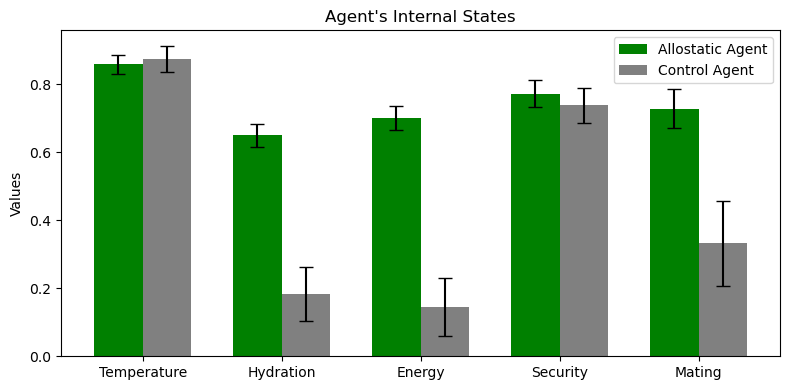

In [22]:
labels = ['Temperature', 'Hydration', 'Energy', 'Security', 'Mating']  # x-axis labels

x = np.arange(len(labels))  # positions for labels
width = 0.35  # width of each bar

# Create plot
fig, ax = plt.subplots(figsize=(8, 4))
bars1 = ax.bar(x - width/2, allostatic_mean_ISs, width, label='Allostatic Agent', color='green', yerr=allostatic_std_ISs, capsize=5)
bars2 = ax.bar(x + width/2, control_mean_ISs, width, label='Control Agent', color='gray', yerr=control_std_ISs, capsize=5)

# Add labels and title
ax.set_ylabel('Values')
ax.set_title("Agent's Internal States")
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.tight_layout()
plt.show()

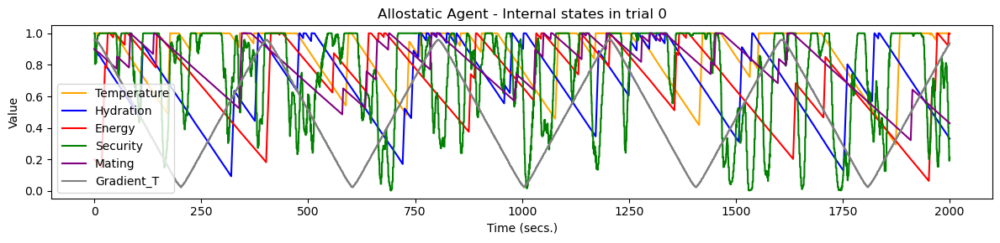

In [23]:
trial = 0
x = allostatic_trial_time[trial]

plt.figure(figsize=(12, 3))
plt.plot(x, allostatic_IS_temperature[trial], label='Temperature', color= 'Orange')
plt.plot(x, allostatic_IS_hydration[trial], label='Hydration', color= 'Blue')
plt.plot(x, allostatic_IS_energy[trial], label='Energy', color= 'Red')
plt.plot(x, allostatic_IS_security[trial], label='Security', color= 'Green')
plt.plot(x, allostatic_IS_mating[trial], label='Mating', color= 'Purple')
plt.plot(x, allostatic_gradient_temp[trial], label='Gradient_T', color= 'Gray')

# Labels and legend
plt.xlabel('Time (secs.)')
plt.ylabel('Value')
plt.title('Allostatic Agent - Internal states in trial ' + str(trial))
plt.legend()
plt.tight_layout()
plt.show()

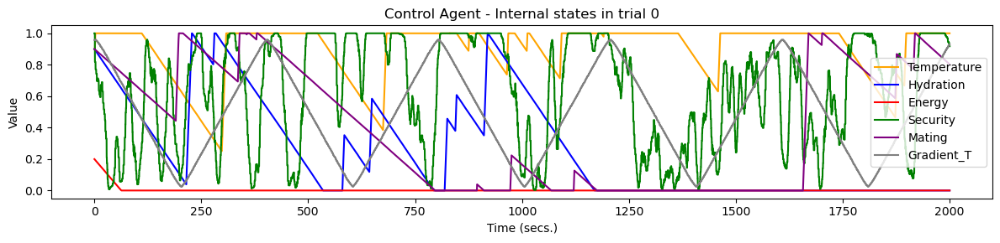

In [24]:
trial = 0
x = control_trial_time[trial]

plt.figure(figsize=(12, 3))
plt.plot(x, control_IS_temperature[trial], label='Temperature', color= 'Orange')
plt.plot(x, control_IS_hydration[trial], label='Hydration', color= 'Blue')
plt.plot(x, control_IS_energy[trial], label='Energy', color= 'Red')
plt.plot(x, control_IS_security[trial], label='Security', color= 'Green')
plt.plot(x, control_IS_mating[trial], label='Mating', color= 'Purple')
plt.plot(x, control_gradient_temp[trial], label='Gradient_T', color= 'Gray')

# Labels and legend
plt.xlabel('Time (secs.)')
plt.ylabel('Value')
plt.title('Control Agent - Internal states in trial ' + str(trial))
plt.legend()
plt.tight_layout()
plt.show()

### Exploring correlations between internal states and environmental temperature
#### Within sessions

## This analysis loses too much information; go to the next section "within trials".

We define clusters of internal states given the temperature in the arena.

These clusters are built by grouping all internal states in a certain temperature level.

In the *within* analysis, we concatenate all internal state values no matter what session they belong to. Then, we average for each temperature cluster.

- Advantage: Fewer points (one per cluster).
- Disadvantage: We loose between session variability.

In [25]:
max_gradient_temp = np.max(allostatic_gradient_temp[0])
min_gradient_temp = np.min(allostatic_gradient_temp[0])
n_clusters = int(round((max_gradient_temp - min_gradient_temp), 2) *100)

In [26]:
cluster_thresholds = [] 
low_treshold = min_gradient_temp

for i in range(n_clusters):
    low_treshold += 0.01
    cluster_thresholds.append(low_treshold)

cluster_thresholds = [0] + cluster_thresholds

In [27]:
def plot_within_trial_correlation(allostatic_mean_cluster, control_mean_cluster, cluster_thresholds, internal_state, color):
    x0 = allostatic_mean_cluster
    x1 = control_mean_cluster
    y = cluster_thresholds[:-1]
    
    plt.figure(figsize=(5, 4))
    plt.scatter(x0, y, color=color, label='Allostatic Agent', alpha=0.4)
    plt.scatter(x1, y, color='gray', label='Control Agent', alpha=0.4)
    
    r0, p0 = pearsonr(x0, y)
    slope0, intercept0, *_ = linregress(x0, y)
    line0 = slope0 * np.array(x0) + intercept0
    
    r1, p1 = pearsonr(x1, y)
    slope1, intercept1, *_ = linregress(x1, y)
    line1 = slope1 * np.array(x1) + intercept1
    
    plt.plot(x1, line1, color='gray', linestyle='-', label=f'Fit (r = {r1:.3f})')
    plt.plot(x0, line0, color=color, linestyle='-', label=f'Fit (r = {r0:.3f})')
    
    plt.xlabel('Agent ' + internal_state)
    plt.ylabel('Env. Temperature')
    plt.ylim(0, 1)
    plt.title('Agent ' + internal_state + ' vs. Env. Temperature', fontsize=15)
    plt.legend()
    plt.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()

In [28]:
allo_IS_temperature = list(np.concatenate(allostatic_IS_temperature))
allo_IS_energy = list(np.concatenate(allostatic_IS_energy))
allo_IS_hydration = list(np.concatenate(allostatic_IS_hydration))
allo_IS_security = list(np.concatenate(allostatic_IS_security))
allo_IS_mating = list(np.concatenate(allostatic_IS_mating))
allo_gradient_temp = list(np.concatenate(allostatic_gradient_temp))


allostatic_temperature_trial_cluster = []
allostatic_energy_trial_cluster = []
allostatic_hydration_trial_cluster = []
allostatic_security_trial_cluster = []
allostatic_mating_trial_cluster = []

for i in range(n_clusters):
    temperature_cluster = []
    energy_cluster = []
    hydration_cluster = []
    security_cluster = []
    mating_cluster = []
    for j in range(len(allo_IS_temperature)):
        if allo_gradient_temp[j] >= cluster_thresholds[i] and allo_gradient_temp[j] < cluster_thresholds[i+1]:
            temperature_cluster.append(allo_IS_temperature[j])
            energy_cluster.append(allo_IS_energy[j])
            hydration_cluster.append(allo_IS_hydration[j])
            security_cluster.append(allo_IS_security[j])
            mating_cluster.append(allo_IS_mating[j])
            
    allostatic_temperature_trial_cluster.append(np.mean(temperature_cluster))
    allostatic_energy_trial_cluster.append(np.mean(energy_cluster))
    allostatic_hydration_trial_cluster.append(np.mean(hydration_cluster))
    allostatic_security_trial_cluster.append(np.mean(security_cluster))
    allostatic_mating_trial_cluster.append(np.mean(mating_cluster))

In [29]:
cont_IS_temperature = list(np.concatenate(control_IS_temperature))
cont_IS_energy = list(np.concatenate(control_IS_energy))
cont_IS_hydration = list(np.concatenate(control_IS_hydration))
cont_IS_security = list(np.concatenate(control_IS_security))
cont_IS_mating = list(np.concatenate(control_IS_mating))
cont_gradient_temp = list(np.concatenate(control_gradient_temp))


control_temperature_trial_cluster = []
control_energy_trial_cluster = []
control_hydration_trial_cluster = []
control_security_trial_cluster = []
control_mating_trial_cluster = []

for i in range(n_clusters):
    temperature_cluster = []
    energy_cluster = []
    hydration_cluster = []
    security_cluster = []
    mating_cluster = []
    for j in range(len(cont_IS_temperature)):
        if cont_gradient_temp[j] >= cluster_thresholds[i] and cont_gradient_temp[j] < cluster_thresholds[i+1]:
            temperature_cluster.append(cont_IS_temperature[j])
            energy_cluster.append(cont_IS_energy[j])
            hydration_cluster.append(cont_IS_hydration[j])
            security_cluster.append(cont_IS_security[j])
            mating_cluster.append(cont_IS_mating[j])
            
    control_temperature_trial_cluster.append(np.mean(temperature_cluster))
    control_energy_trial_cluster.append(np.mean(energy_cluster))
    control_hydration_trial_cluster.append(np.mean(hydration_cluster))
    control_security_trial_cluster.append(np.mean(security_cluster))
    control_mating_trial_cluster.append(np.mean(mating_cluster))

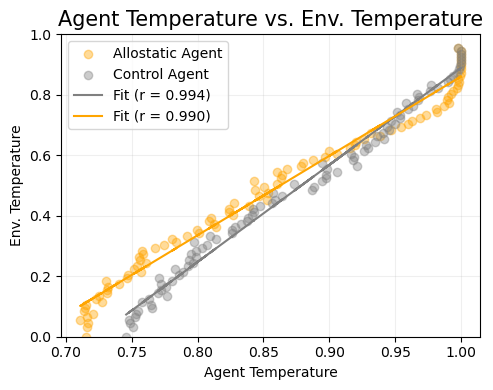

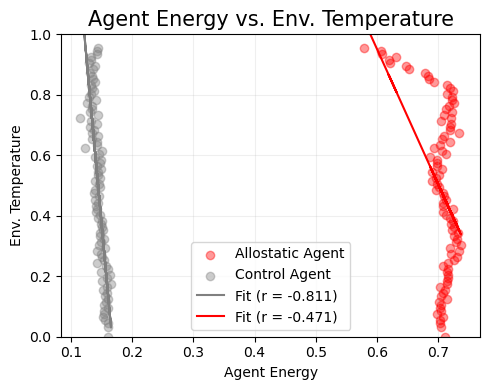

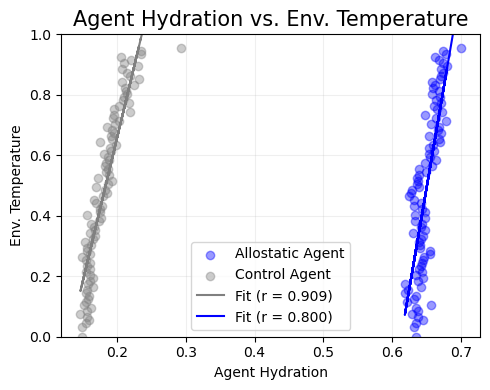

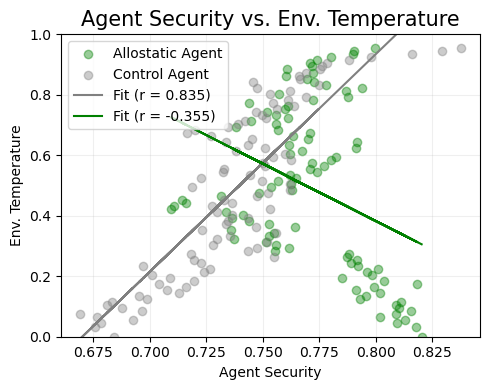

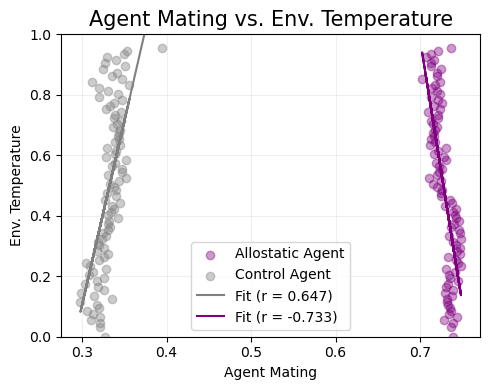

In [30]:
plot_within_trial_correlation(allostatic_temperature_trial_cluster, control_temperature_trial_cluster, cluster_thresholds, 'Temperature', 'orange')
plot_within_trial_correlation(allostatic_energy_trial_cluster, control_energy_trial_cluster, cluster_thresholds, 'Energy', 'red')
plot_within_trial_correlation(allostatic_hydration_trial_cluster, control_hydration_trial_cluster, cluster_thresholds, 'Hydration', 'blue')
plot_within_trial_correlation(allostatic_security_trial_cluster, control_security_trial_cluster, cluster_thresholds, 'Security', 'green')
plot_within_trial_correlation(allostatic_mating_trial_cluster, control_mating_trial_cluster, cluster_thresholds, 'Mating', 'purple')

In [31]:
allostatic_trial_efficienty = []
for i in range(len(allostatic_temperature_trial_cluster)):
    allostatic_trial_efficienty.append((allostatic_temperature_trial_cluster[i] + allostatic_energy_trial_cluster[i] + allostatic_hydration_trial_cluster[i] + allostatic_security_trial_cluster[i] + allostatic_mating_trial_cluster[i]) / 5)

allostatic_trial_fairness = []
for i in range(len(allostatic_temperature_trial_cluster)):
    max_IS = max([allostatic_temperature_trial_cluster[i], allostatic_energy_trial_cluster[i], allostatic_hydration_trial_cluster[i], allostatic_security_trial_cluster[i], allostatic_mating_trial_cluster[i]])
    min_IS = min([allostatic_temperature_trial_cluster[i], allostatic_energy_trial_cluster[i], allostatic_hydration_trial_cluster[i], allostatic_security_trial_cluster[i], allostatic_mating_trial_cluster[i]])
    allostatic_trial_fairness.append(1 - (max_IS - min_IS))

allostatic_trial_stability = []
dV = 1.0
for i in range(len(allostatic_temperature_trial_cluster)):
    full_state = [allostatic_temperature_trial_cluster[i], allostatic_energy_trial_cluster[i], allostatic_hydration_trial_cluster[i], allostatic_security_trial_cluster[i], allostatic_mating_trial_cluster[i]]
    squared_errors = (np.array(full_state) - dV) ** 2
    total_squared_error = np.sum(squared_errors)
    stability = 1 - (total_squared_error / 5)
    allostatic_trial_stability.append(stability)

In [32]:
control_trial_efficienty = []
for i in range(len(control_temperature_trial_cluster)):
    control_trial_efficienty.append((control_temperature_trial_cluster[i] + control_energy_trial_cluster[i] + control_hydration_trial_cluster[i] + control_security_trial_cluster[i] + control_mating_trial_cluster[i]) / 5)

control_trial_fairness = []
for i in range(len(control_temperature_trial_cluster)):
    max_IS = max([control_temperature_trial_cluster[i], control_energy_trial_cluster[i], control_hydration_trial_cluster[i], control_security_trial_cluster[i], control_mating_trial_cluster[i]])
    min_IS = min([control_temperature_trial_cluster[i], control_energy_trial_cluster[i], control_hydration_trial_cluster[i], control_security_trial_cluster[i], control_mating_trial_cluster[i]])
    control_trial_fairness.append(1 - (max_IS - min_IS))

control_trial_stability = []
dV = 1.0
for i in range(len(control_temperature_trial_cluster)):
    full_state = [control_temperature_trial_cluster[i], control_energy_trial_cluster[i], control_hydration_trial_cluster[i], control_security_trial_cluster[i], control_mating_trial_cluster[i]]
    squared_errors = (np.array(full_state) - dV) ** 2
    total_squared_error = np.sum(squared_errors)
    stability = 1 - (total_squared_error / 5)
    control_trial_stability.append(stability)

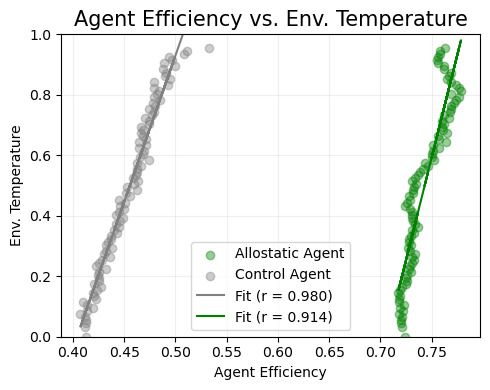

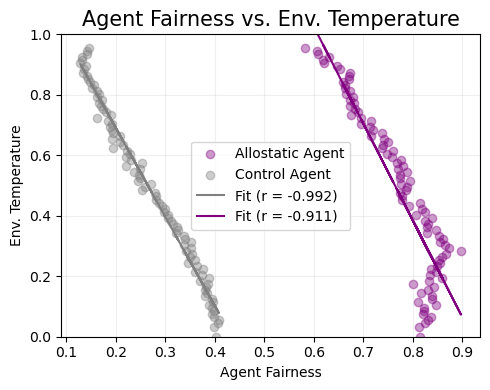

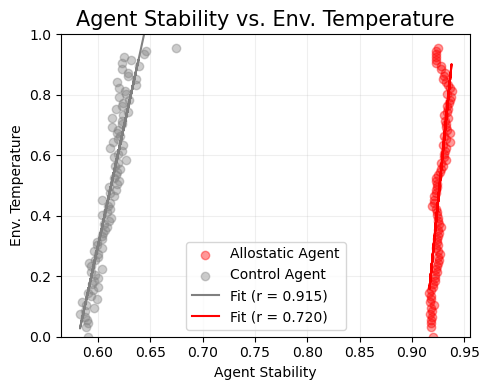

In [33]:
plot_within_trial_correlation(allostatic_trial_efficienty, control_trial_efficienty, cluster_thresholds, 'Efficiency', 'green')
plot_within_trial_correlation(allostatic_trial_fairness, control_trial_fairness, cluster_thresholds, 'Fairness', 'purple')
plot_within_trial_correlation(allostatic_trial_stability, control_trial_stability, cluster_thresholds, 'Stability', 'red')

## Risk Analysis



In [34]:
risk_threshold = .10

allostatic_risk_timesteps_temperature = []
allostatic_risk_timesteps_energy = []
allostatic_risk_timesteps_hydration = []
allostatic_risk_timesteps_security = []
allostatic_risk_timesteps_mating = []
allostatic_trials_length = []

for i in range(allostatic_n_experiments):
    risk_timesteps_temperature = 0
    risk_timesteps_energy = 0
    risk_timesteps_hydration = 0
    risk_timesteps_security = 0
    risk_timesteps_mating = 0
    allostatic_trials_length.append(len(allostatic_IS_security[i]))
    
    for j in range(len(allostatic_IS_security[i])):
        if allostatic_IS_temperature[i][j] < risk_threshold:
            risk_timesteps_temperature += 1
        if allostatic_IS_energy[i][j] < risk_threshold:
            risk_timesteps_energy += 1
        if allostatic_IS_hydration[i][j] < risk_threshold:
            risk_timesteps_hydration += 1
        if allostatic_IS_security[i][j] < risk_threshold:
            risk_timesteps_security += 1
        if allostatic_IS_mating[i][j] < risk_threshold:
            risk_timesteps_mating += 1
    
    allostatic_risk_timesteps_temperature.append(risk_timesteps_temperature)
    allostatic_risk_timesteps_energy.append(risk_timesteps_energy)
    allostatic_risk_timesteps_hydration.append(risk_timesteps_hydration)
    allostatic_risk_timesteps_security.append(risk_timesteps_security)
    allostatic_risk_timesteps_mating.append(risk_timesteps_mating)

In [35]:
allostatic_risk_percents_temperature = [a / b*100 for a, b in zip(allostatic_risk_timesteps_temperature, allostatic_trials_length)]
allostatic_risk_percents_energy = [a / b*100 for a, b in zip(allostatic_risk_timesteps_energy, allostatic_trials_length)]
allostatic_risk_percents_hydration = [a / b*100 for a, b in zip(allostatic_risk_timesteps_hydration, allostatic_trials_length)]
allostatic_risk_percents_security = [a / b*100 for a, b in zip(allostatic_risk_timesteps_security, allostatic_trials_length)]
allostatic_risk_percents_mating = [a / b*100 for a, b in zip(allostatic_risk_timesteps_mating, allostatic_trials_length)]

In [36]:
allostatic_mean_risk_temperature = np.mean(allostatic_risk_percents_temperature)
allostatic_std_risk_temperature = np.std(allostatic_risk_percents_temperature)
allostatic_mean_risk_energy = np.mean(allostatic_risk_percents_energy)
allostatic_std_risk_energy = np.std(allostatic_risk_percents_energy)
allostatic_mean_risk_hydration = np.mean(allostatic_risk_percents_hydration)
allostatic_std_risk_hydration = np.std(allostatic_risk_percents_hydration)
allostatic_mean_risk_security = np.mean(allostatic_risk_percents_security)
allostatic_std_risk_security = np.std(allostatic_risk_percents_security)
allostatic_mean_risk_mating = np.mean(allostatic_risk_percents_mating)
allostatic_std_risk_mating = np.std(allostatic_risk_percents_mating)

In [37]:
control_risk_timesteps_temperature = []
control_risk_timesteps_energy = []
control_risk_timesteps_hydration = []
control_risk_timesteps_security = []
control_risk_timesteps_mating = []
control_trials_length = []

for i in range(control_n_experiments):
    risk_timesteps_temperature = 0
    risk_timesteps_energy = 0
    risk_timesteps_hydration = 0
    risk_timesteps_security = 0
    risk_timesteps_mating = 0
    control_trials_length.append(len(control_IS_security[i]))
    
    for j in range(len(control_IS_security[i])):
        if control_IS_temperature[i][j] < risk_threshold:
            risk_timesteps_temperature += 1
        if control_IS_energy[i][j] < risk_threshold:
            risk_timesteps_energy += 1
        if control_IS_hydration[i][j] < risk_threshold:
            risk_timesteps_hydration += 1
        if control_IS_security[i][j] < risk_threshold:
            risk_timesteps_security += 1
        if control_IS_mating[i][j] < risk_threshold:
            risk_timesteps_mating += 1
    
    control_risk_timesteps_temperature.append(risk_timesteps_temperature)
    control_risk_timesteps_energy.append(risk_timesteps_energy)
    control_risk_timesteps_hydration.append(risk_timesteps_hydration)
    control_risk_timesteps_security.append(risk_timesteps_security)
    control_risk_timesteps_mating.append(risk_timesteps_mating)

In [38]:
control_risk_percents_temperature = [a / b*100 for a, b in zip(control_risk_timesteps_temperature, control_trials_length)]
control_risk_percents_energy = [a / b*100 for a, b in zip(control_risk_timesteps_energy, control_trials_length)]
control_risk_percents_hydration = [a / b*100 for a, b in zip(control_risk_timesteps_hydration, control_trials_length)]
control_risk_percents_security = [a / b*100 for a, b in zip(control_risk_timesteps_security, control_trials_length)]
control_risk_percents_mating = [a / b*100 for a, b in zip(control_risk_timesteps_mating, control_trials_length)]

In [39]:
control_mean_risk_temperature = np.mean(control_risk_percents_temperature)
control_std_risk_temperature = np.std(control_risk_percents_temperature)
control_mean_risk_energy = np.mean(control_risk_percents_energy)
control_std_risk_energy = np.std(control_risk_percents_energy)
control_mean_risk_hydration = np.mean(control_risk_percents_hydration)
control_std_risk_hydration = np.std(control_risk_percents_hydration)
control_mean_risk_security = np.mean(control_risk_percents_security)
control_std_risk_security = np.std(control_risk_percents_security)
control_mean_risk_mating = np.mean(control_risk_percents_mating)
control_std_risk_mating = np.std(control_risk_percents_mating)

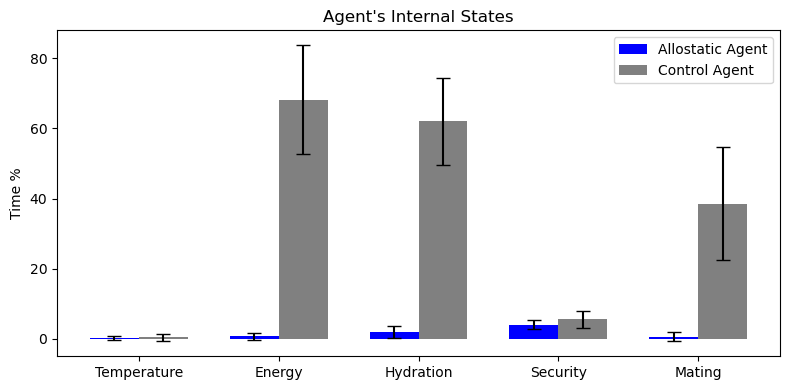

In [40]:
allostatic_mean_risks = [allostatic_mean_risk_temperature, allostatic_mean_risk_energy, allostatic_mean_risk_hydration, allostatic_mean_risk_security, allostatic_mean_risk_mating]
control_mean_risks = [control_mean_risk_temperature, control_mean_risk_energy, control_mean_risk_hydration, control_mean_risk_security, control_mean_risk_mating]
allostatic_std_risks = [allostatic_std_risk_temperature, allostatic_std_risk_energy, allostatic_std_risk_hydration, allostatic_std_risk_security, allostatic_std_risk_mating]
control_std_risks = [control_std_risk_temperature, control_std_risk_energy, control_std_risk_hydration, control_std_risk_security, control_std_risk_mating]


labels = ['Temperature', 'Energy', 'Hydration', 'Security', 'Mating']  # x-axis labels

x = np.arange(len(labels))  # positions for labels
width = 0.35  # width of each bar

# Create plot
fig, ax = plt.subplots(figsize=(8, 4))
bars1 = ax.bar(x - width/2, allostatic_mean_risks, width, label='Allostatic Agent', color='blue', yerr=allostatic_std_risks, capsize=5)
bars2 = ax.bar(x + width/2, control_mean_risks, width, label='Control Agent', color='gray', yerr=control_std_risks, capsize=5)

# Add labels and title
ax.set_ylabel('Time %')
ax.set_title("Agent's Internal States")
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.tight_layout()
plt.show()

### Exploring correlations between internal states and environmental temperature
#### Within trials

In [41]:
allostatic_temperature_trial_cluster = []
allostatic_energy_trial_cluster = []
allostatic_hydration_trial_cluster = []
allostatic_security_trial_cluster = []
allostatic_mating_trial_cluster = []

for exp in range(len(allostatic_IS_temperature)): # Find mean ISs for each cluster in each experiment
    temperature_trial_cluster_exp = []
    energy_trial_cluster_exp = []
    hydration_trial_cluster_exp = []
    security_trial_cluster_exp = []
    mating_trial_cluster_exp = []

    for i in range(n_clusters):
        temperature_cluster = []
        energy_cluster = []
        hydration_cluster = []
        security_cluster = []
        mating_cluster = []
        for j in range(len(allostatic_IS_temperature[exp])):
            if allostatic_gradient_temp[exp][j] >= cluster_thresholds[i] and allostatic_gradient_temp[exp][j] < cluster_thresholds[i+1]:
                temperature_cluster.append(allostatic_IS_temperature[exp][j])
                energy_cluster.append(allostatic_IS_energy[exp][j])
                hydration_cluster.append(allostatic_IS_hydration[exp][j])
                security_cluster.append(allostatic_IS_security[exp][j])
                mating_cluster.append(allostatic_IS_mating[exp][j])
                
        temperature_trial_cluster_exp.append(np.mean(temperature_cluster))
        energy_trial_cluster_exp.append(np.mean(energy_cluster))
        hydration_trial_cluster_exp.append(np.mean(hydration_cluster))
        security_trial_cluster_exp.append(np.mean(security_cluster))
        mating_trial_cluster_exp.append(np.mean(mating_cluster))
        
    allostatic_temperature_trial_cluster.append(temperature_trial_cluster_exp)
    allostatic_energy_trial_cluster.append(energy_trial_cluster_exp)
    allostatic_hydration_trial_cluster.append(hydration_trial_cluster_exp)
    allostatic_security_trial_cluster.append(security_trial_cluster_exp)
    allostatic_mating_trial_cluster.append(mating_trial_cluster_exp)

In [42]:
control_temperature_trial_cluster = []
control_energy_trial_cluster = []
control_hydration_trial_cluster = []
control_security_trial_cluster = []
control_mating_trial_cluster = []

for exp in range(len(control_IS_temperature)): # Find mean ISs for each cluster in each experiment
    temperature_trial_cluster_exp = []
    energy_trial_cluster_exp = []
    hydration_trial_cluster_exp = []
    security_trial_cluster_exp = []
    mating_trial_cluster_exp = []

    for i in range(n_clusters):
        temperature_cluster = []
        energy_cluster = []
        hydration_cluster = []
        security_cluster = []
        mating_cluster = []
        for j in range(len(control_IS_temperature[exp])):
            if control_gradient_temp[exp][j] >= cluster_thresholds[i] and control_gradient_temp[exp][j] < cluster_thresholds[i+1]:
                temperature_cluster.append(control_IS_temperature[exp][j])
                energy_cluster.append(control_IS_energy[exp][j])
                hydration_cluster.append(control_IS_hydration[exp][j])
                security_cluster.append(control_IS_security[exp][j])
                mating_cluster.append(control_IS_mating[exp][j])
                
        temperature_trial_cluster_exp.append(np.mean(temperature_cluster))
        energy_trial_cluster_exp.append(np.mean(energy_cluster))
        hydration_trial_cluster_exp.append(np.mean(hydration_cluster))
        security_trial_cluster_exp.append(np.mean(security_cluster))
        mating_trial_cluster_exp.append(np.mean(mating_cluster))
        
    control_temperature_trial_cluster.append(temperature_trial_cluster_exp)
    control_energy_trial_cluster.append(energy_trial_cluster_exp)
    control_hydration_trial_cluster.append(hydration_trial_cluster_exp)
    control_security_trial_cluster.append(security_trial_cluster_exp)
    control_mating_trial_cluster.append(mating_trial_cluster_exp)

In [43]:
allostatic_temperature_trial_cluster = list(np.concatenate(allostatic_temperature_trial_cluster))
allostatic_energy_trial_cluster = list(np.concatenate(allostatic_energy_trial_cluster))
allostatic_hydration_trial_cluster = list(np.concatenate(allostatic_hydration_trial_cluster))
allostatic_security_trial_cluster = list(np.concatenate(allostatic_security_trial_cluster))
allostatic_mating_trial_cluster = list(np.concatenate(allostatic_mating_trial_cluster))

control_temperature_trial_cluster = list(np.concatenate(control_temperature_trial_cluster))
control_energy_trial_cluster = list(np.concatenate(control_energy_trial_cluster))
control_hydration_trial_cluster = list(np.concatenate(control_hydration_trial_cluster))
control_security_trial_cluster = list(np.concatenate(control_security_trial_cluster))
control_mating_trial_cluster = list(np.concatenate(control_mating_trial_cluster))

In [44]:
def plot_within_trial_correlation(allostatic_mean_cluster, control_mean_cluster, cluster_thresholds, internal_state, color):
    x0 = allostatic_mean_cluster
    x1 = control_mean_cluster
    y = cluster_thresholds[:-1] *20
    
    plt.figure(figsize=(5, 4))
    plt.scatter(x0, y, color=color, label='Allostatic Agent', alpha=0.2)
    plt.scatter(x1, y, color='gray', label='Control Agent', alpha=0.2)
    
    r0, p0 = pearsonr(x0, y)
    slope0, intercept0, *_ = linregress(x0, y)
    line0 = slope0 * np.array(x0) + intercept0
    
    r1, p1 = pearsonr(x1, y)
    slope1, intercept1, *_ = linregress(x1, y)
    line1 = slope1 * np.array(x1) + intercept1
    
    plt.plot(x1, line1, color='gray', linestyle='-', label=f'Fit (r = {r1:.3f})')
    plt.plot(x0, line0, color=color, linestyle='-', label=f'Fit (r = {r0:.3f})')
    
    plt.xlabel('Agent ' + internal_state)
    plt.ylabel('Env. Temperature')
    plt.ylim(0, 1)
    plt.title('Agent ' + internal_state + ' vs. Env. Temperature', fontsize=15)
    plt.legend()
    plt.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()

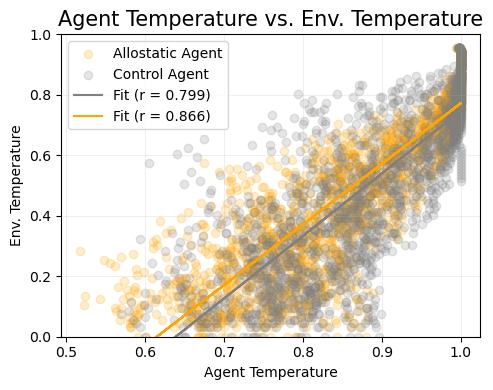

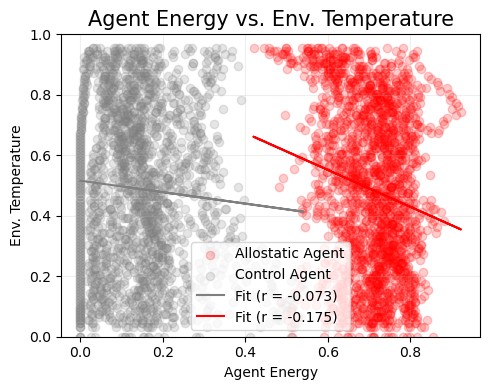

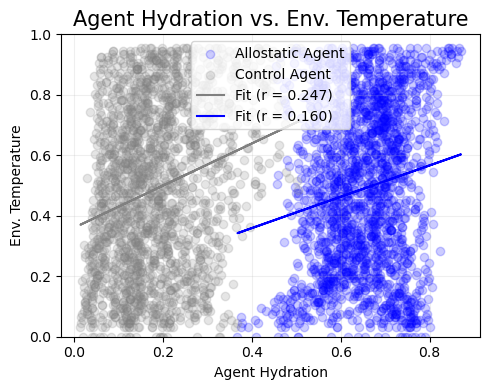

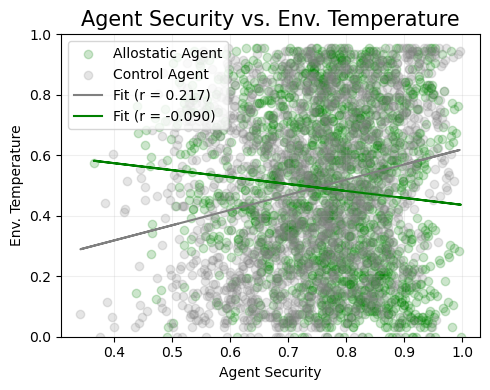

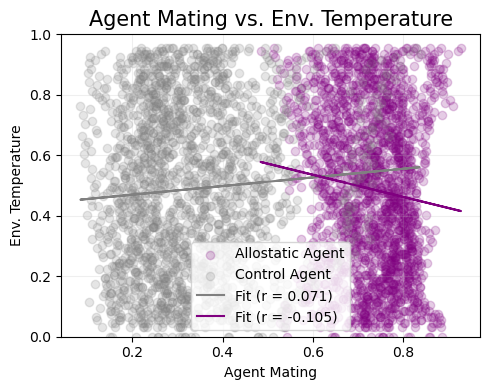

In [45]:
plot_within_trial_correlation(allostatic_temperature_trial_cluster, control_temperature_trial_cluster, cluster_thresholds, 'Temperature', 'orange')
plot_within_trial_correlation(allostatic_energy_trial_cluster, control_energy_trial_cluster, cluster_thresholds, 'Energy', 'red')
plot_within_trial_correlation(allostatic_hydration_trial_cluster, control_hydration_trial_cluster, cluster_thresholds, 'Hydration', 'blue')
plot_within_trial_correlation(allostatic_security_trial_cluster, control_security_trial_cluster, cluster_thresholds, 'Security', 'green')
plot_within_trial_correlation(allostatic_mating_trial_cluster, control_mating_trial_cluster, cluster_thresholds, 'Mating', 'purple')

In [46]:
allostatic_trial_efficienty = []
for i in range(len(allostatic_temperature_trial_cluster)):
    allostatic_trial_efficienty.append((allostatic_temperature_trial_cluster[i] + allostatic_energy_trial_cluster[i] + allostatic_hydration_trial_cluster[i] + allostatic_security_trial_cluster[i] + allostatic_mating_trial_cluster[i]) / 5)

allostatic_trial_fairness = []
for i in range(len(allostatic_temperature_trial_cluster)):
    max_IS = max([allostatic_temperature_trial_cluster[i], allostatic_energy_trial_cluster[i], allostatic_hydration_trial_cluster[i], allostatic_security_trial_cluster[i], allostatic_mating_trial_cluster[i]])
    min_IS = min([allostatic_temperature_trial_cluster[i], allostatic_energy_trial_cluster[i], allostatic_hydration_trial_cluster[i], allostatic_security_trial_cluster[i], allostatic_mating_trial_cluster[i]])
    allostatic_trial_fairness.append(1 - (max_IS - min_IS))

allostatic_trial_stability = []
dV = 1.0
for i in range(len(allostatic_temperature_trial_cluster)):
    full_state = [allostatic_temperature_trial_cluster[i], allostatic_energy_trial_cluster[i], allostatic_hydration_trial_cluster[i], allostatic_security_trial_cluster[i], allostatic_mating_trial_cluster[i]]
    squared_errors = (np.array(full_state) - dV) ** 2
    total_squared_error = np.sum(squared_errors)
    stability = 1 - (total_squared_error / 5)
    allostatic_trial_stability.append(stability)

In [47]:
control_trial_efficienty = []
for i in range(len(control_temperature_trial_cluster)):
    control_trial_efficienty.append((control_temperature_trial_cluster[i] + control_energy_trial_cluster[i] + control_hydration_trial_cluster[i] + control_security_trial_cluster[i] + control_mating_trial_cluster[i]) / 5)

control_trial_fairness = []
for i in range(len(control_temperature_trial_cluster)):
    max_IS = max([control_temperature_trial_cluster[i], control_energy_trial_cluster[i], control_hydration_trial_cluster[i], control_security_trial_cluster[i], control_mating_trial_cluster[i]])
    min_IS = min([control_temperature_trial_cluster[i], control_energy_trial_cluster[i], control_hydration_trial_cluster[i], control_security_trial_cluster[i], control_mating_trial_cluster[i]])
    control_trial_fairness.append(1 - (max_IS - min_IS))

control_trial_stability = []
dV = 1.0
for i in range(len(control_temperature_trial_cluster)):
    full_state = [control_temperature_trial_cluster[i], control_energy_trial_cluster[i], control_hydration_trial_cluster[i], control_security_trial_cluster[i], control_mating_trial_cluster[i]]
    squared_errors = (np.array(full_state) - dV) ** 2
    total_squared_error = np.sum(squared_errors)
    stability = 1 - (total_squared_error / 5)
    control_trial_stability.append(stability)

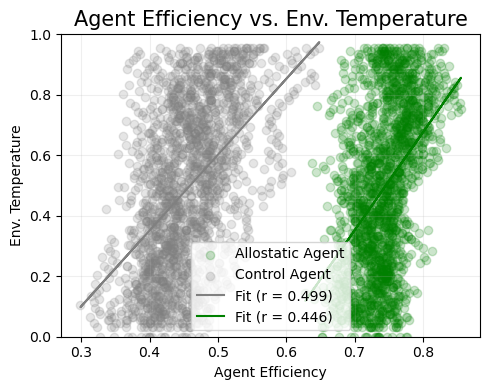

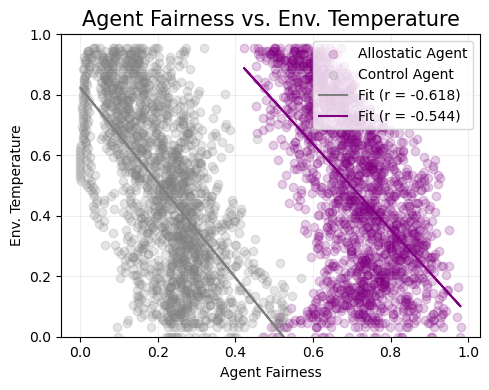

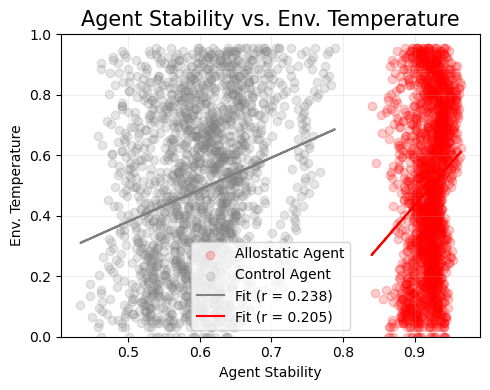

In [48]:
plot_within_trial_correlation(allostatic_trial_efficienty, control_trial_efficienty, cluster_thresholds, 'Efficiency', 'green')
plot_within_trial_correlation(allostatic_trial_fairness, control_trial_fairness, cluster_thresholds, 'Fairness', 'purple')
plot_within_trial_correlation(allostatic_trial_stability, control_trial_stability, cluster_thresholds, 'Stability', 'red')

In [49]:
# Proportion of the trial where the agent was in a risk state for each Internal need

risk_threshold = .10

allostatic_risk_timesteps_temperature = []
allostatic_risk_timesteps_energy = []
allostatic_risk_timesteps_hydration = []
allostatic_risk_timesteps_security = []
allostatic_risk_timesteps_mating = []
allostatic_trials_length = []

for i in range(allostatic_n_experiments):
    risk_timesteps_temperature = 0
    risk_timesteps_energy = 0
    risk_timesteps_hydration = 0
    risk_timesteps_security = 0
    risk_timesteps_mating = 0
    allostatic_trials_length.append(len(allostatic_IS_security[i]))
    
    for j in range(len(allostatic_IS_security[i])):
        if allostatic_IS_temperature[i][j] < risk_threshold:
            risk_timesteps_temperature += 1
        if allostatic_IS_energy[i][j] < risk_threshold:
            risk_timesteps_energy += 1
        if allostatic_IS_hydration[i][j] < risk_threshold:
            risk_timesteps_hydration += 1
        if allostatic_IS_security[i][j] < risk_threshold:
            risk_timesteps_security += 1
        if allostatic_IS_mating[i][j] < risk_threshold:
            risk_timesteps_mating += 1
    
    allostatic_risk_timesteps_temperature.append(risk_timesteps_temperature)
    allostatic_risk_timesteps_energy.append(risk_timesteps_energy)
    allostatic_risk_timesteps_hydration.append(risk_timesteps_hydration)
    allostatic_risk_timesteps_security.append(risk_timesteps_security)
    allostatic_risk_timesteps_mating.append(risk_timesteps_mating)

In [50]:
control_risk_timesteps_temperature = []
control_risk_timesteps_energy = []
control_risk_timesteps_hydration = []
control_risk_timesteps_security = []
control_risk_timesteps_mating = []
control_trials_length = []

for i in range(control_n_experiments):
    risk_timesteps_temperature = 0
    risk_timesteps_energy = 0
    risk_timesteps_hydration = 0
    risk_timesteps_security = 0
    risk_timesteps_mating = 0
    control_trials_length.append(len(control_IS_security[i]))
    
    for j in range(len(control_IS_security[i])):
        if control_IS_temperature[i][j] < risk_threshold:
            risk_timesteps_temperature += 1
        if control_IS_energy[i][j] < risk_threshold:
            risk_timesteps_energy += 1
        if control_IS_hydration[i][j] < risk_threshold:
            risk_timesteps_hydration += 1
        if control_IS_security[i][j] < risk_threshold:
            risk_timesteps_security += 1
        if control_IS_mating[i][j] < risk_threshold:
            risk_timesteps_mating += 1
    
    control_risk_timesteps_temperature.append(risk_timesteps_temperature)
    control_risk_timesteps_energy.append(risk_timesteps_energy)
    control_risk_timesteps_hydration.append(risk_timesteps_hydration)
    control_risk_timesteps_security.append(risk_timesteps_security)
    control_risk_timesteps_mating.append(risk_timesteps_mating)

In [51]:
allostatic_risk_percents_temperature = [a / b*100 for a, b in zip(allostatic_risk_timesteps_temperature, allostatic_trials_length)]
allostatic_risk_percents_energy = [a / b*100 for a, b in zip(allostatic_risk_timesteps_energy, allostatic_trials_length)]
allostatic_risk_percents_hydration = [a / b*100 for a, b in zip(allostatic_risk_timesteps_hydration, allostatic_trials_length)]
allostatic_risk_percents_security = [a / b*100 for a, b in zip(allostatic_risk_timesteps_security, allostatic_trials_length)]
allostatic_risk_percents_mating = [a / b*100 for a, b in zip(allostatic_risk_timesteps_mating, allostatic_trials_length)]

control_risk_percents_temperature = [a / b*100 for a, b in zip(control_risk_timesteps_temperature, control_trials_length)]
control_risk_percents_energy = [a / b*100 for a, b in zip(control_risk_timesteps_energy, control_trials_length)]
control_risk_percents_hydration = [a / b*100 for a, b in zip(control_risk_timesteps_hydration, control_trials_length)]
control_risk_percents_security = [a / b*100 for a, b in zip(control_risk_timesteps_security, control_trials_length)]
control_risk_percents_mating = [a / b*100 for a, b in zip(control_risk_timesteps_mating, control_trials_length)]

In [52]:
allostatic_risk_percents_temperature

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.16835016835016833,
 0.4453391898487067,
 0.0,
 0.0,
 0.0,
 2.409049220421889,
 0.0,
 0.0,
 0.0,
 1.1873106177725559]

In [53]:
allostatic_risk_timesteps_hydration

[13,
 0,
 62,
 1089,
 250,
 131,
 549,
 0,
 287,
 569,
 296,
 457,
 346,
 309,
 245,
 509,
 259,
 32,
 658,
 87]

In [54]:
allostatic_risk_timesteps_security

[588,
 761,
 407,
 600,
 688,
 733,
 595,
 343,
 1095,
 1088,
 491,
 521,
 682,
 701,
 633,
 553,
 660,
 513,
 881,
 553]

In [55]:
allostatic_risk_timesteps_mating

[0, 0, 40, 874, 493, 0, 98, 0, 0, 0, 0, 0, 0, 99, 0, 0, 0, 0, 45, 0]

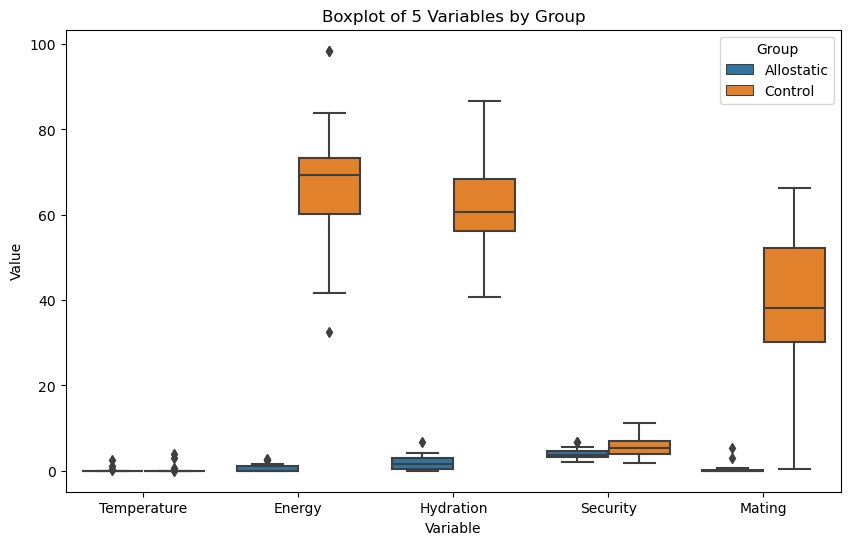

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Example data
data = {
    'Group': ['Allostatic'] * allostatic_n_experiments + ['Control'] * control_n_experiments,
    'Temperature': allostatic_risk_percents_temperature + control_risk_percents_temperature,
    'Energy': allostatic_risk_percents_energy + control_risk_percents_energy,
    'Hydration': allostatic_risk_percents_hydration + control_risk_percents_hydration,
    'Security': allostatic_risk_percents_security + control_risk_percents_security,
    'Mating': allostatic_risk_percents_mating + control_risk_percents_mating
}

df = pd.DataFrame(data)

# Melt to long format
df_long = df.melt(id_vars='Group', var_name='Variable', value_name='Value')

# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_long, x='Variable', y='Value', hue='Group')
plt.title("Boxplot of 5 Variables by Group")
plt.show()

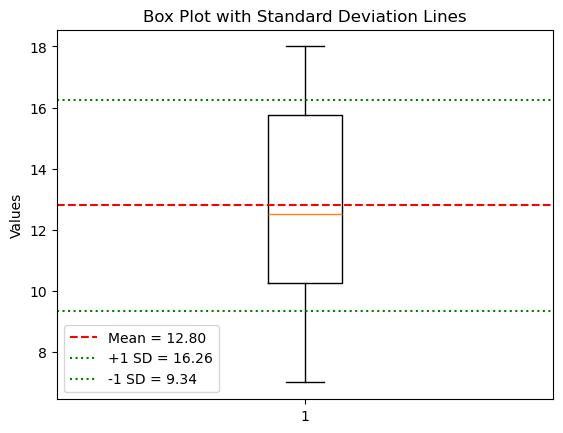

In [57]:
data = [7, 15, 13, 18, 9, 11, 10, 16, 17, 12]
mean = np.mean(data)
std = np.std(data)

plt.boxplot(data)
plt.axhline(mean, color='r', linestyle='--', label=f'Mean = {mean:.2f}')
plt.axhline(mean + std, color='g', linestyle=':', label=f'+1 SD = {mean+std:.2f}')
plt.axhline(mean - std, color='g', linestyle=':', label=f'-1 SD = {mean-std:.2f}')

plt.title("Box Plot with Standard Deviation Lines")
plt.ylabel("Values")
plt.legend()
plt.show()

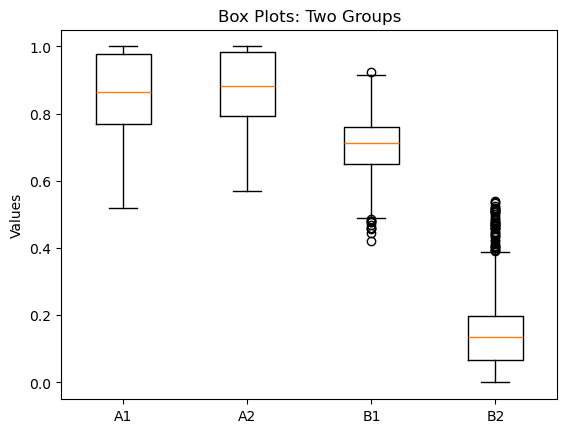

In [58]:
# Two lists from Group A
a1 = allostatic_temperature_trial_cluster
a2 = control_temperature_trial_cluster

# Two lists from Group B
b1 = allostatic_energy_trial_cluster
b2 = control_energy_trial_cluster

data = [a1, a2, b1, b2]
labels = ['A1', 'A2', 'B1', 'B2']

plt.boxplot(data)
plt.xticks([1, 2, 3, 4], labels)
plt.title("Box Plots: Two Groups")
plt.ylabel("Values")
plt.show()

## TO DO

-  Analysis of critical security riks
-  Analysis of security and other internal states.